In [ ]:
import os
import numpy as np
import scipy.io as sio
import cv2
import random
from torch.utils.data import Dataset
from torchvision import transforms
import torch
import torch.nn as nn
import torch.nn.functional as F

In [32]:
class MMFIDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.data_index = self._build_index()
        self.transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                               std=[0.229, 0.224, 0.225])
        ])

    def _build_index(self):
        data_index = []
        for session in os.listdir(self.root_dir):
            session_path = os.path.join(self.root_dir, session)
            if not os.path.isdir(session_path):
                continue
            for action in os.listdir(session_path):
                action_path = os.path.join(session_path, action)
                if not os.path.isdir(action_path):
                    continue
                csi_path = os.path.join(action_path, 'wifi-csi')
                rgb_path = os.path.join(action_path, 'rgb')
                if not os.path.exists(csi_path) or not os.path.exists(rgb_path):
                    continue
                label = int(action[1:]) - 1
                for mat_file in os.listdir(csi_path):
                    if not mat_file.endswith('.mat'):
                        continue
                    png_file = os.path.splitext(mat_file)[0] + '.png'
                    mat_path = os.path.join(csi_path, mat_file)
                    rgb_img_path = os.path.join(rgb_path, png_file)
                    if os.path.exists(rgb_img_path):
                        data_index.append((mat_path, rgb_img_path, label))
        return data_index

    def __len__(self):
        return len(self.data_index)

    def _handle_nan_in_csi(self, csi_data):
        csi_data = np.nan_to_num(csi_data, nan=0.0, posinf=1.0, neginf=-1.0)
        for i in range(csi_data.shape[0]):
            ant = csi_data[i]
            m, s = ant.mean(), ant.std()
            csi_data[i] = (ant - m) / (s + 1e-8)
        return csi_data

    def __getitem__(self, idx):
        mat_path, rgb_path, label = self.data_index[idx]

        # 1. Đọc và xử lý CSI data
        mat = sio.loadmat(mat_path)
        csi_amp = self._handle_nan_in_csi(mat['CSIamp'].astype(np.float32))
        csi_phase = self._handle_nan_in_csi(mat['CSIphase'].astype(np.float32))

        # 2. Đọc ảnh RGB positive
        pos = cv2.imread(rgb_path)
        if pos is None:
            raise RuntimeError(f"Cannot read RGB image from {rgb_path}")
        pos = cv2.cvtColor(pos, cv2.COLOR_BGR2RGB)  # Chuyển BGR sang RGB

        # 3. Chọn ảnh RGB negative
        neg_candidates = [x for x in self.data_index if x[2] != label]
        neg_path = random.choice(neg_candidates)[1]
        neg = cv2.imread(neg_path)
        if neg is None:
            raise RuntimeError(f"Cannot read negative RGB image from {neg_path}")
        neg = cv2.cvtColor(neg, cv2.COLOR_BGR2RGB)

        # 4. Áp dụng transform và normalize ảnh RGB (không crop)
        pos = self.transform(pos)  # [C, H, W], đã normalized
        neg = self.transform(neg)

        # 5. CSI to tensor
        csi_amp = torch.from_numpy(csi_amp).float()
        csi_phase = torch.from_numpy(csi_phase).float()

        # 6. NaN check
        assert not torch.isnan(pos).any(), f"NaN in pos image {rgb_path}"
        assert not torch.isnan(neg).any(), f"NaN in neg image {neg_path}"
        assert not torch.isnan(csi_amp).any(), f"NaN in CSI amp {mat_path}"
        assert not torch.isnan(csi_phase).any(), f"NaN in CSI phase {mat_path}"

        return (csi_amp, csi_phase), pos, neg

In [33]:
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import DataLoader, Subset

# Tạo dataset
dataset = MMFIDataset(root_dir='/kaggle/input/e-merged/E_Merged')

In [34]:
import torch
from torch.utils.data import Dataset
from collections import defaultdict
import random

indices = list(range(len(dataset)))

train_indices, test_indices = train_test_split(indices, test_size=0.2, random_state=42)

train_subset = Subset(dataset, train_indices)
test_subset = Subset(dataset, test_indices)

train_loader = DataLoader(train_subset, batch_size=8, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_subset, batch_size=8, shuffle=False, num_workers=4, pin_memory=True)

# Kiểm tra kích thước của các tập con
print(f'Train size: {len(train_loader.dataset)}')
print(f'Test size: {len(test_loader.dataset)}')

Train size: 3024
Test size: 756


# Pretrain CSIEncoder

In [67]:
class CSIEncoder(nn.Module):
    def __init__(self, input_shape=(3, 114, 10), feature_dim=512):
        super().__init__()
        self.feature_dim = feature_dim
        
        C, H, W = input_shape

        self.encoder = nn.Sequential(
            nn.LayerNorm(input_shape),
            nn.Conv2d(C, 32, kernel_size=3, stride=1, padding=1),
            nn.GELU(),

            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),  # [B, 64, H/2, W/2]
            nn.BatchNorm2d(64),
            nn.GELU(),

            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # [B, 128, H/4, W/4]
            nn.BatchNorm2d(128),
            nn.GELU(),

            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),  # [B, 256, H/8, W/8]
            nn.BatchNorm2d(256),
            nn.GELU(),

            nn.AdaptiveAvgPool2d((1,1)),
        )

        self.fc = nn.Linear(256, feature_dim)

    def forward(self, x):
        x = self.encoder(x)     # [B, 256, 1, 1]
        x = x.view(x.size(0), -1)  # [B, 256]
        x = self.fc(x)             # [B, feature_dim]
        return x

In [68]:
class CSIDecoder(nn.Module):
    def __init__(self, feature_dim=512, output_shape=(3, 114, 10)):
        super().__init__()
        self.output_shape = output_shape
        C, H, W = output_shape
        
        self.linear = nn.Sequential(
            nn.Linear(feature_dim, 256 * (H // 8) * (W // 8)),
            nn.ReLU()
        )
        
        self.decoder = nn.Sequential(
            nn.Unflatten(1, (256, H // 8, W // 8)),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # H/4
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),   # H/2
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),    # H
            nn.ReLU(),
            nn.Conv2d(32, C, kernel_size=3, padding=1)
        )
        
    def forward(self, x):
        x = self.linear(x)
        x = self.decoder(x)
        x = F.interpolate(x, size=self.output_shape[1:], mode='bilinear', align_corners=False)
        return x


Epoch 1/20
Train loss: 0.675159


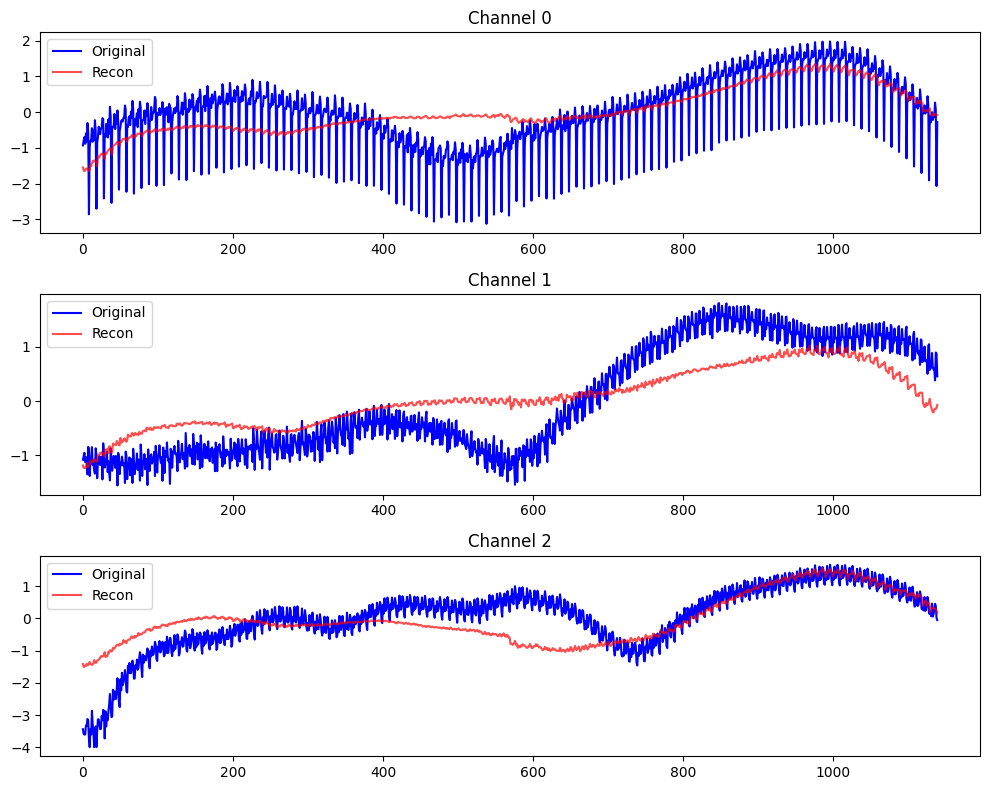

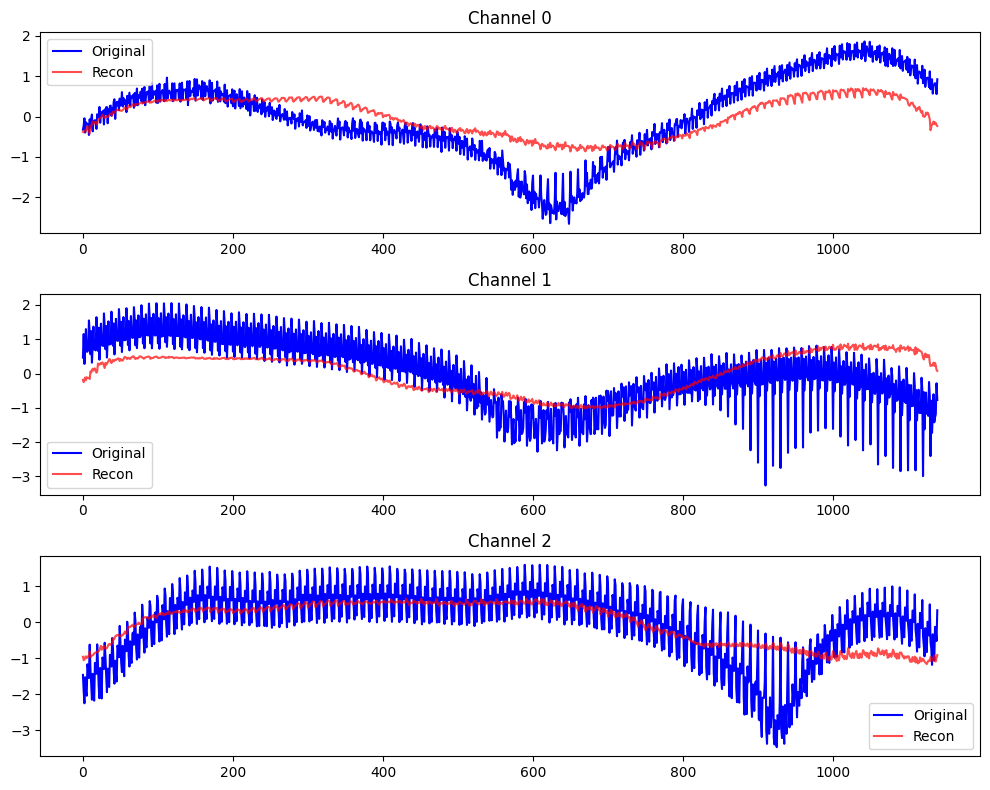

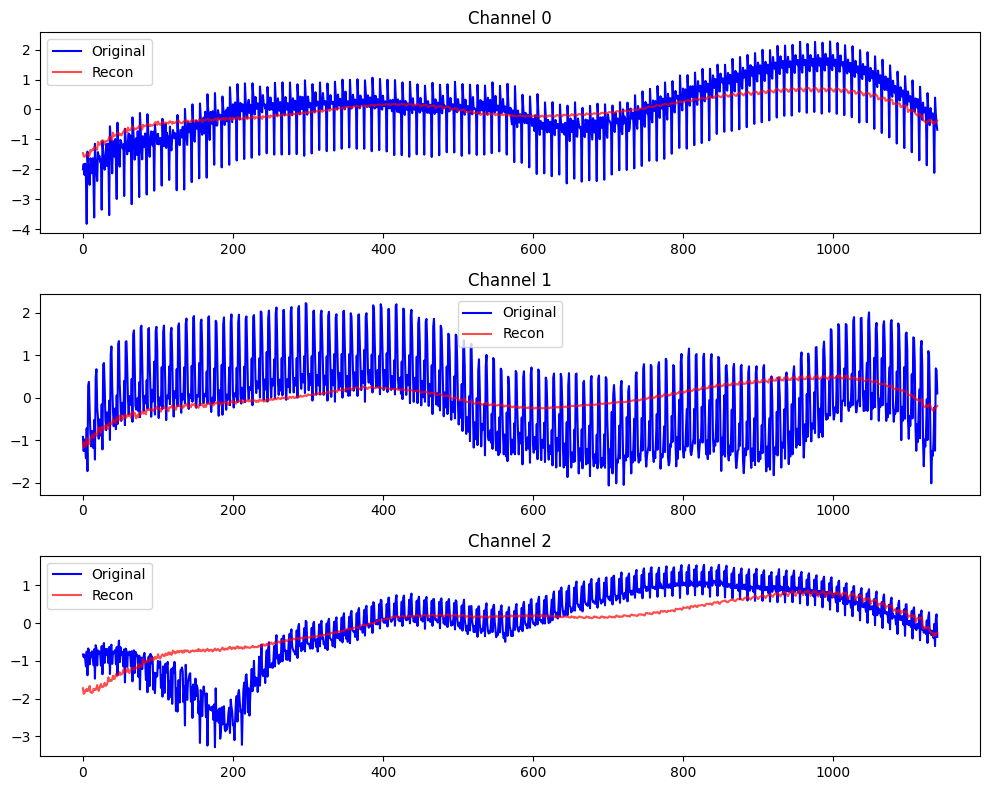

Validation loss: 0.006356
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 2/20
Train loss: 0.499514


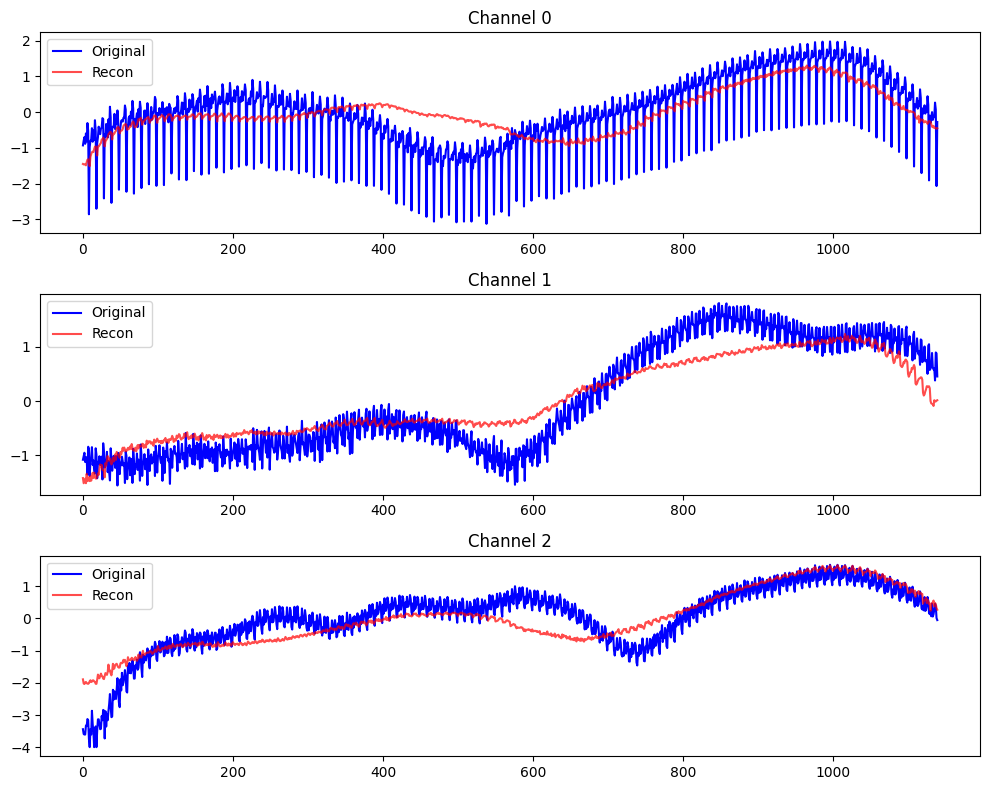

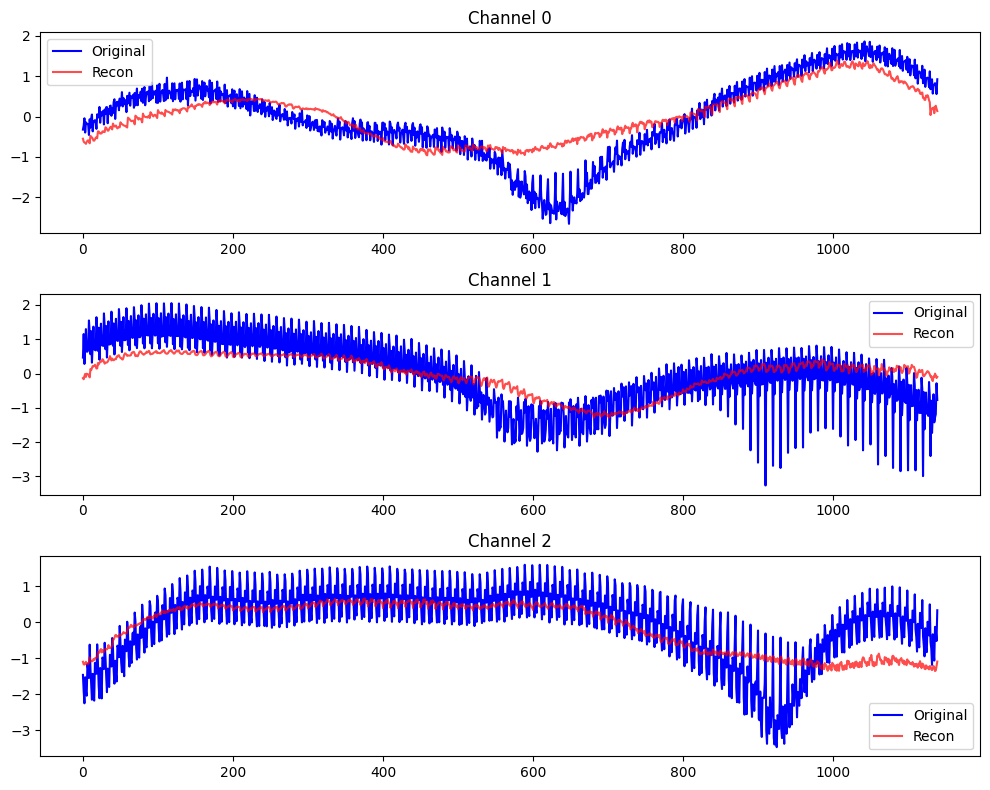

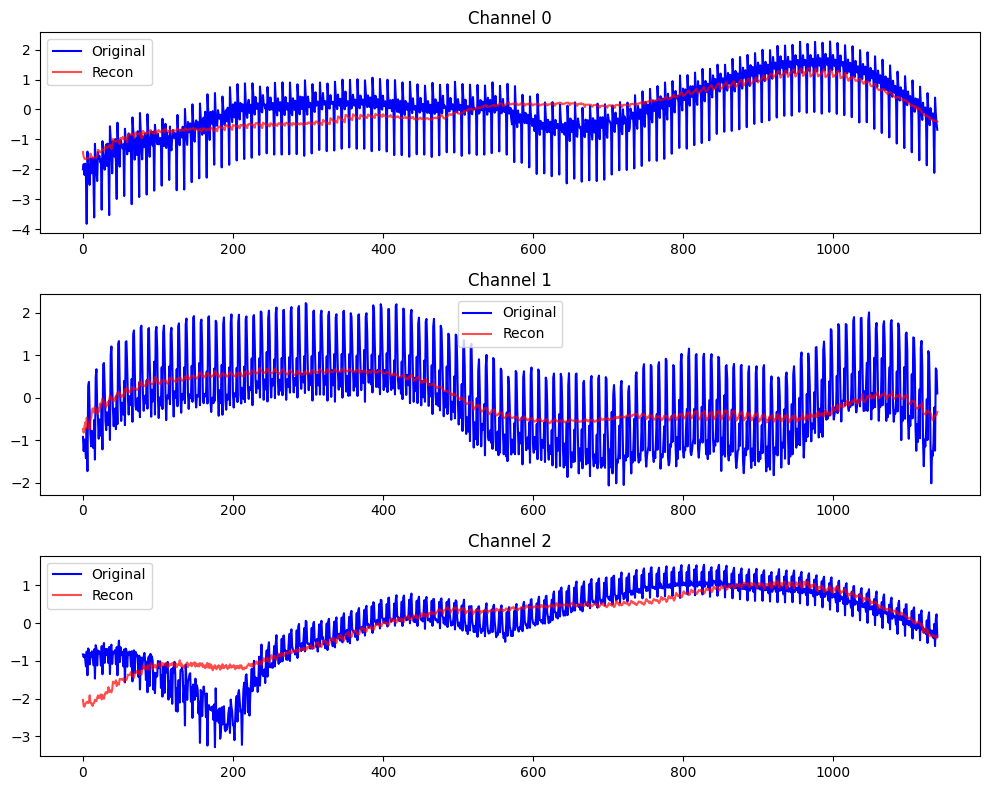

Validation loss: 0.004433
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 3/20
Train loss: 0.417632


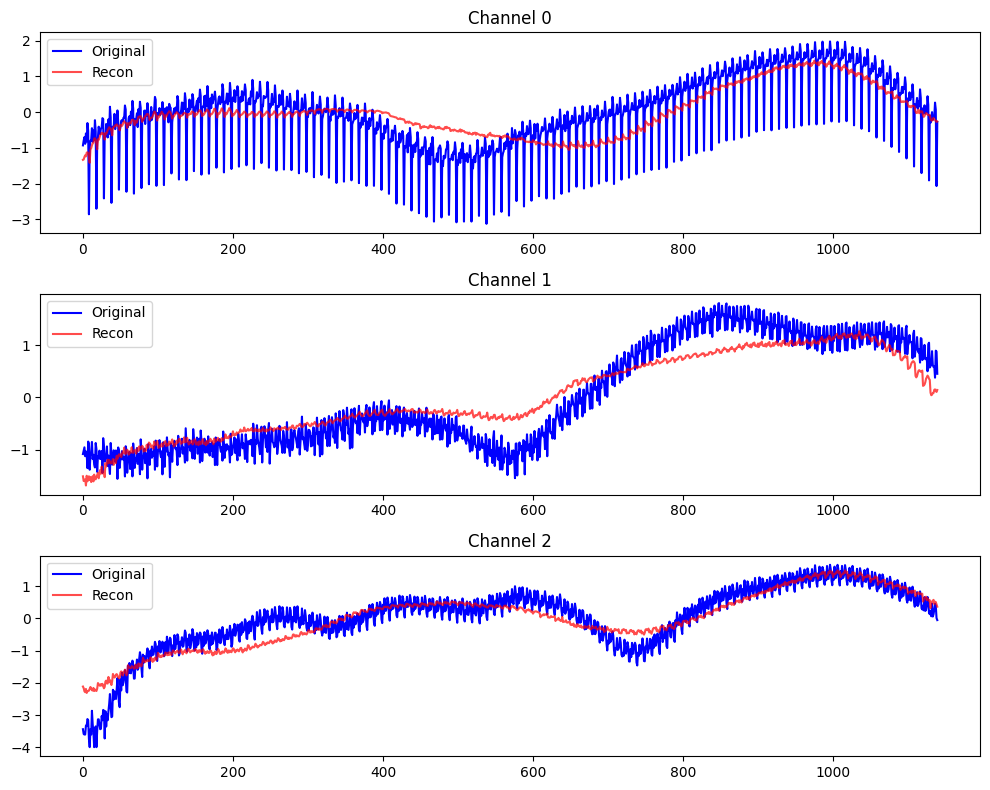

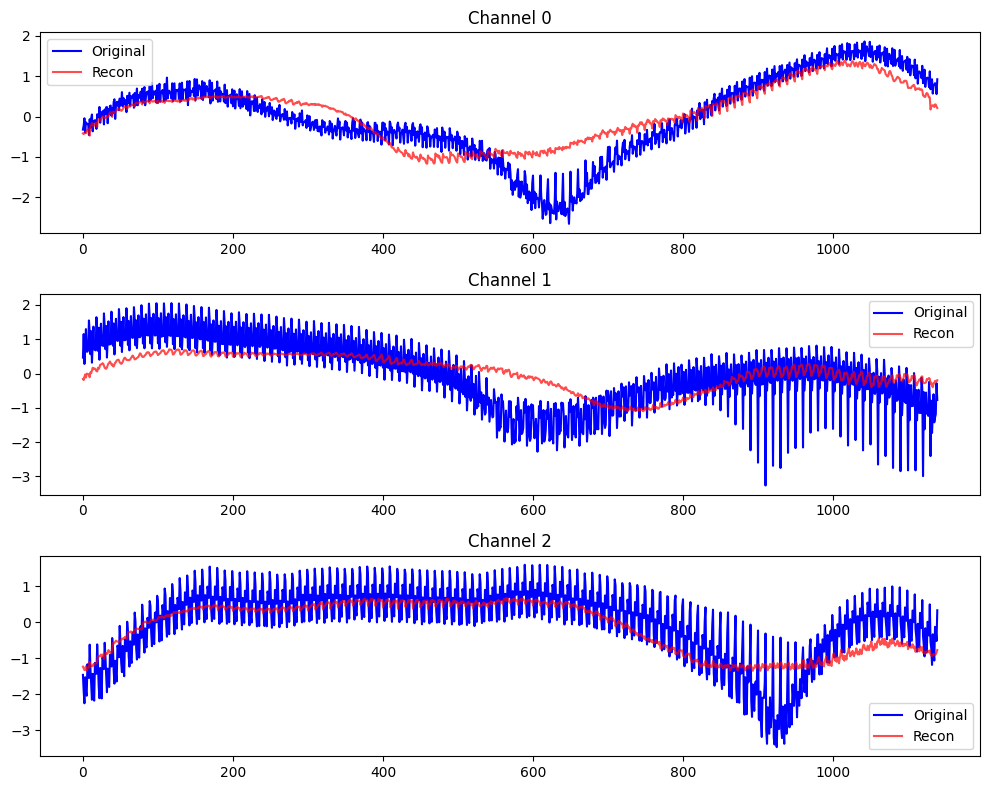

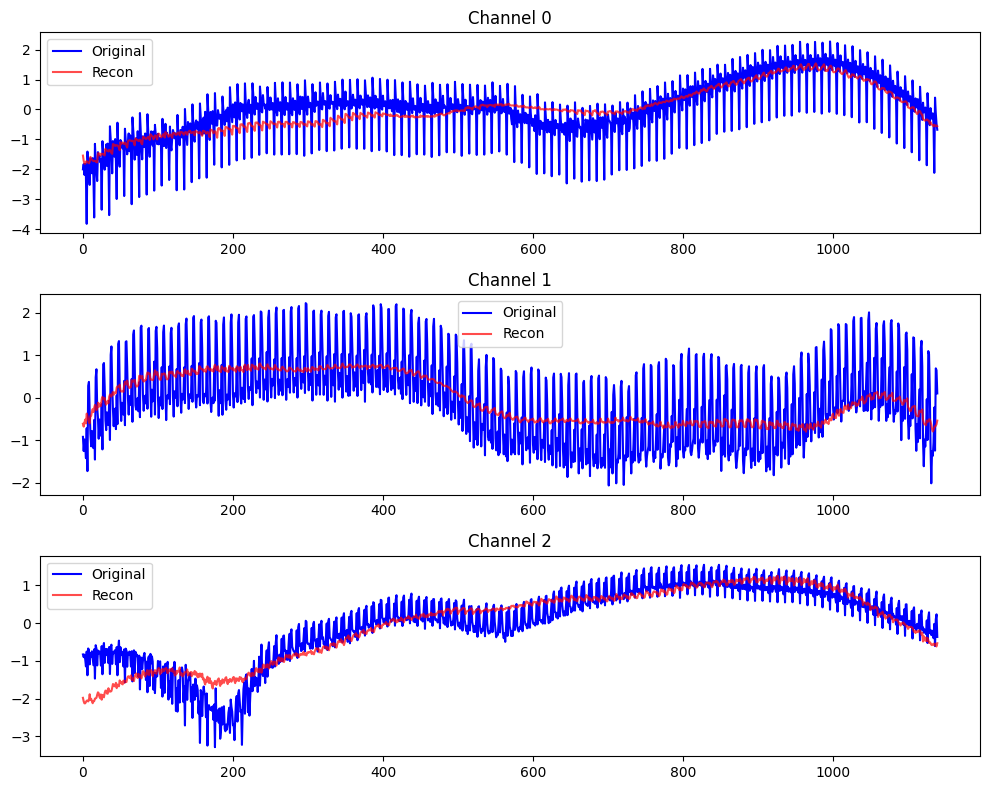

Validation loss: 0.003951
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 4/20
Train loss: 0.384401


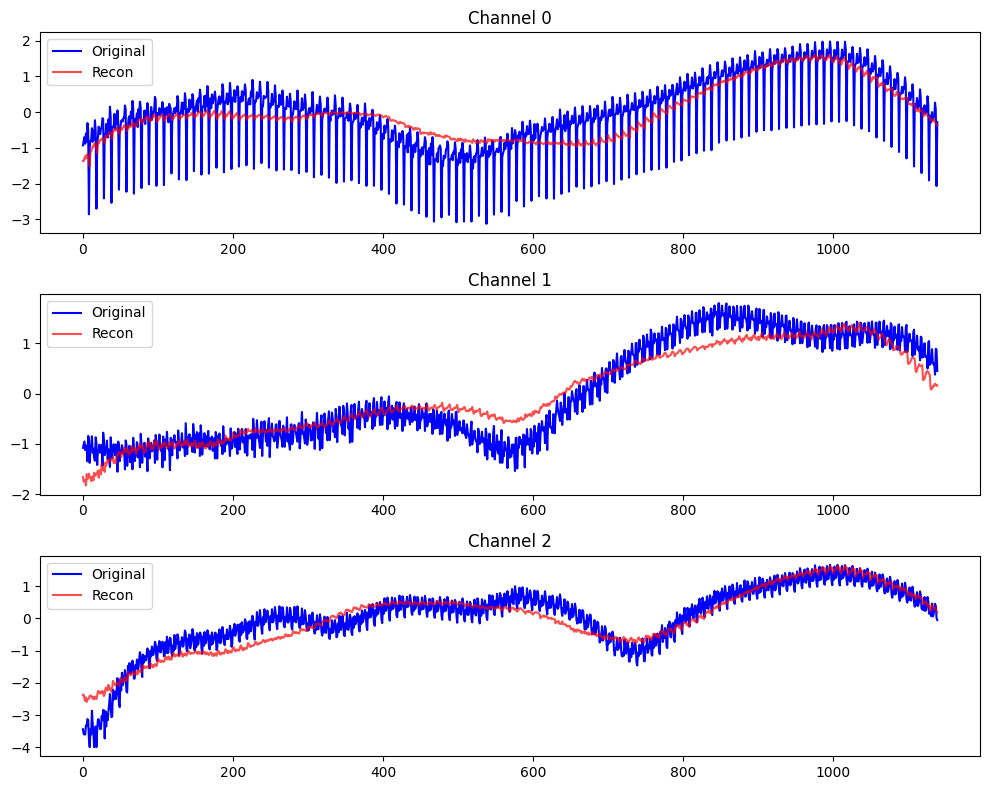

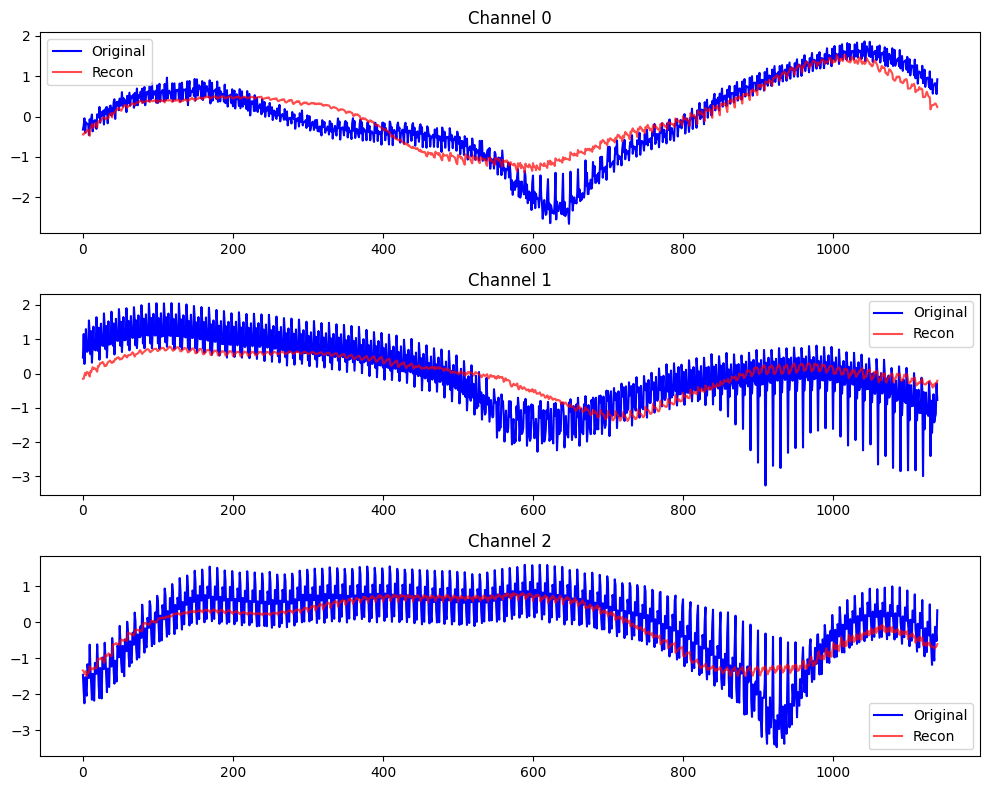

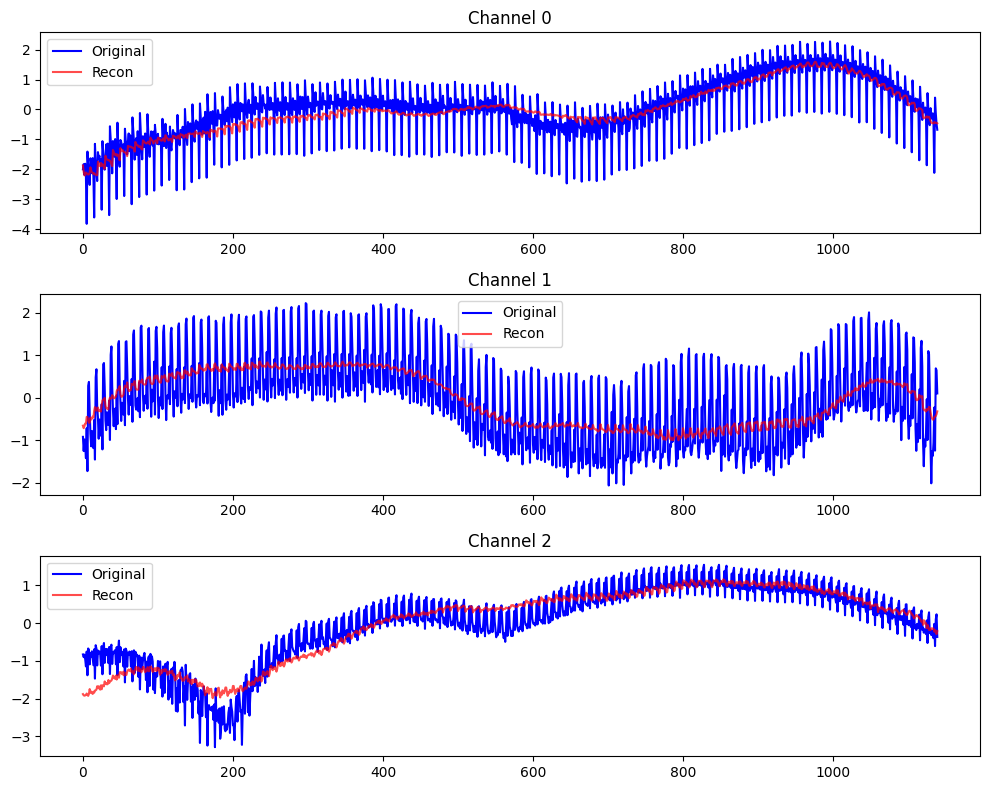

Validation loss: 0.003515
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 5/20
Train loss: 0.363479


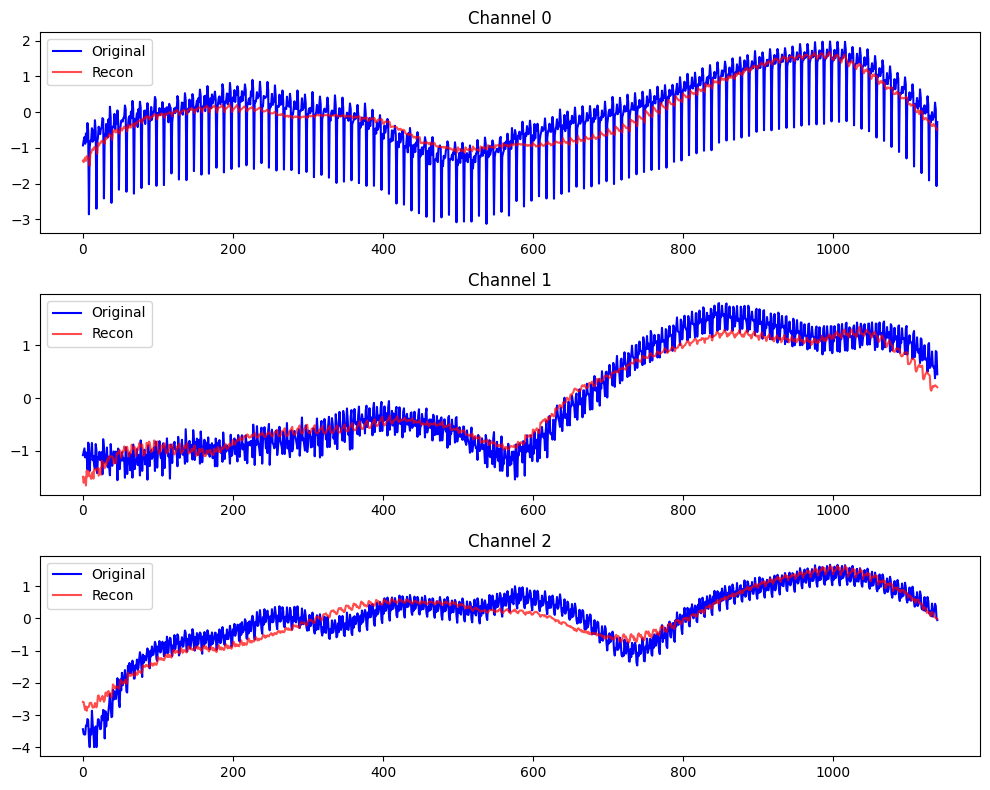

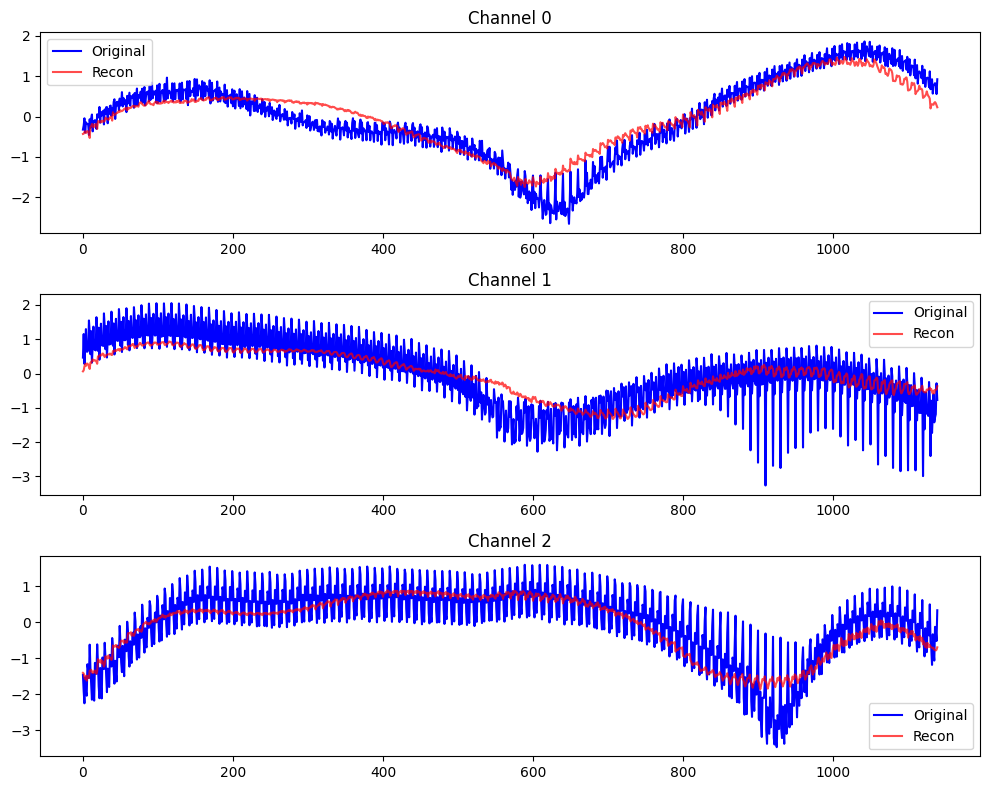

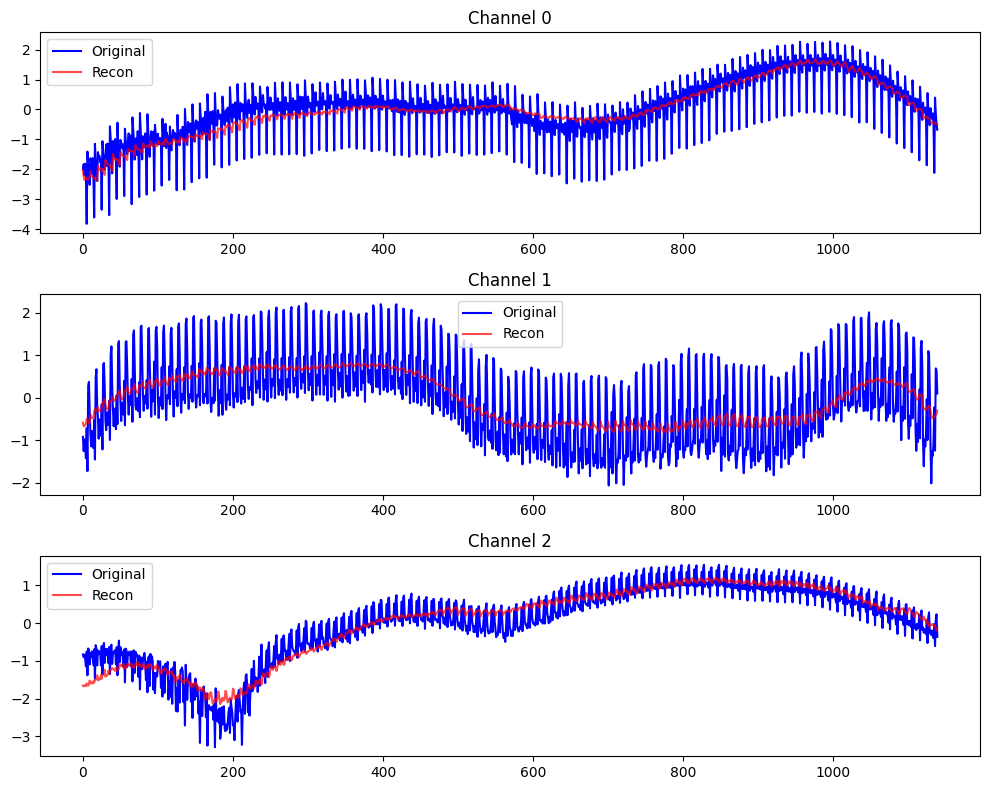

Validation loss: 0.003274
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 6/20
Train loss: 0.348449


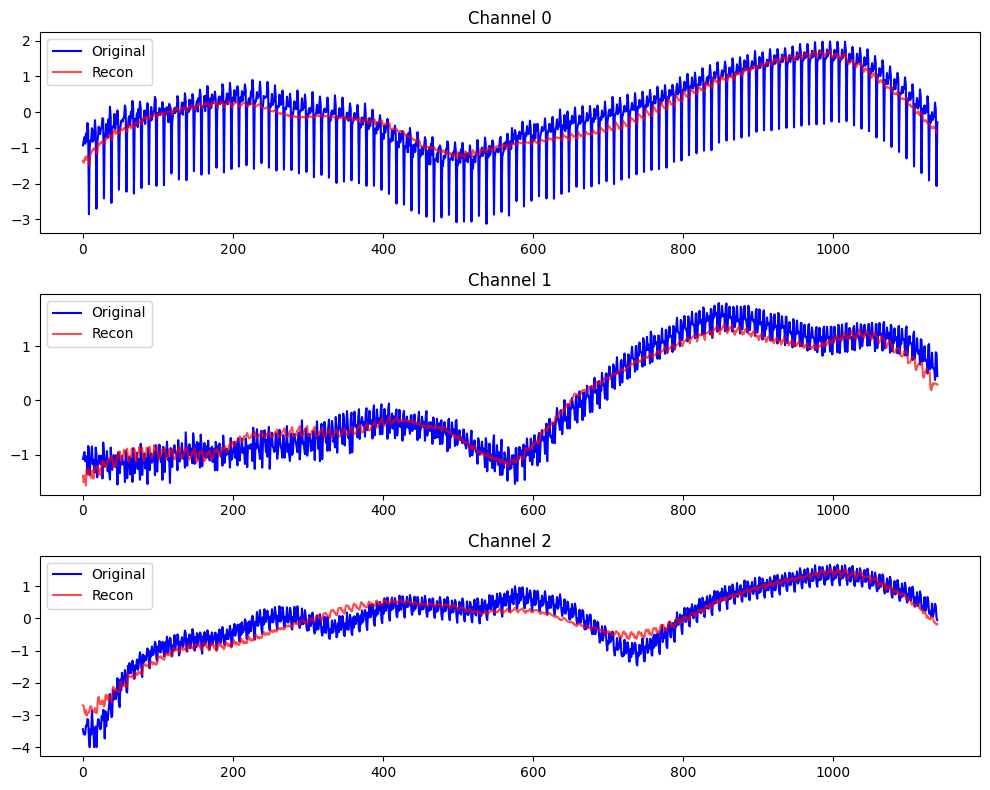

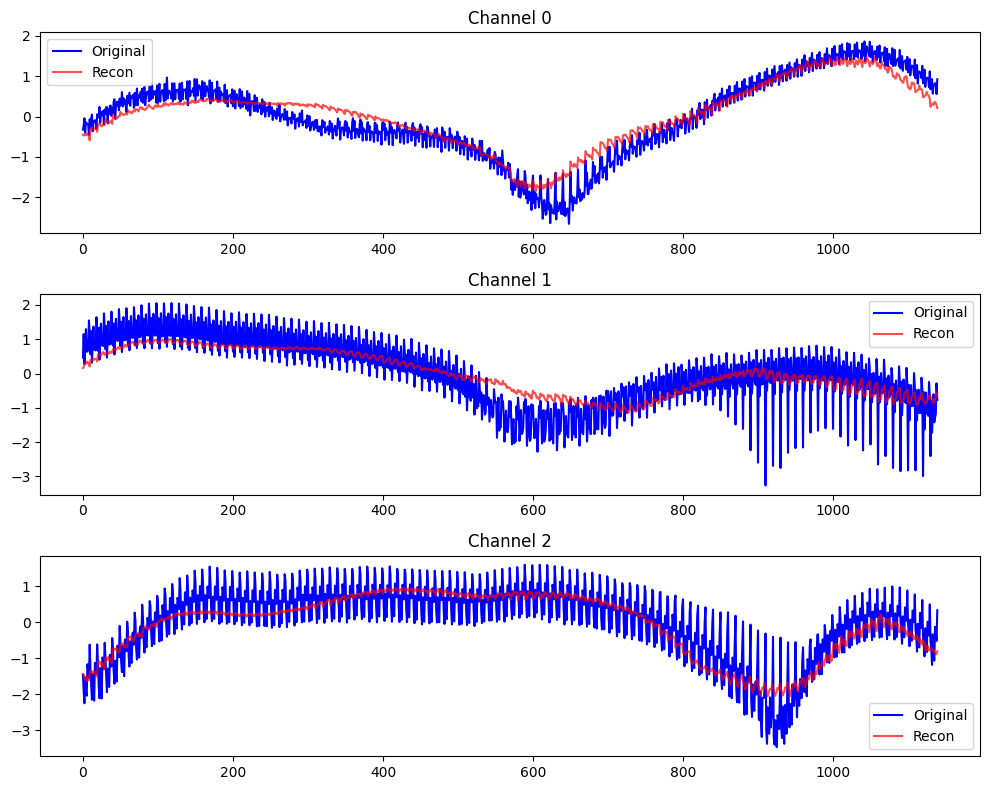

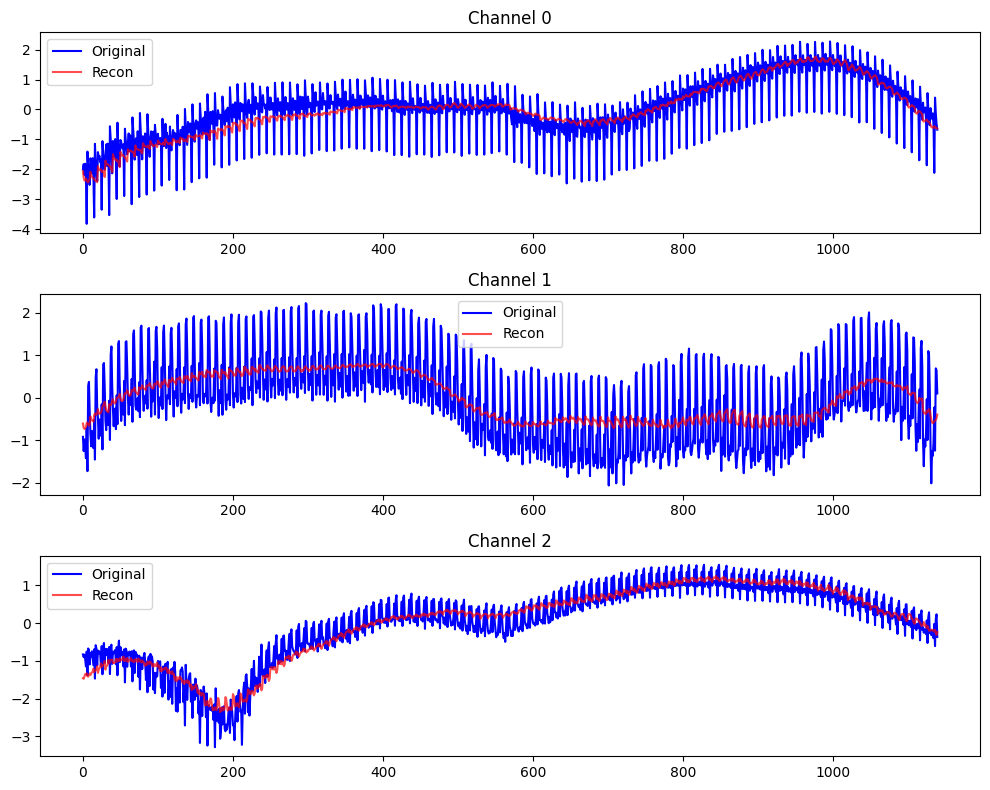

Validation loss: 0.003153
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 7/20
Train loss: 0.336990


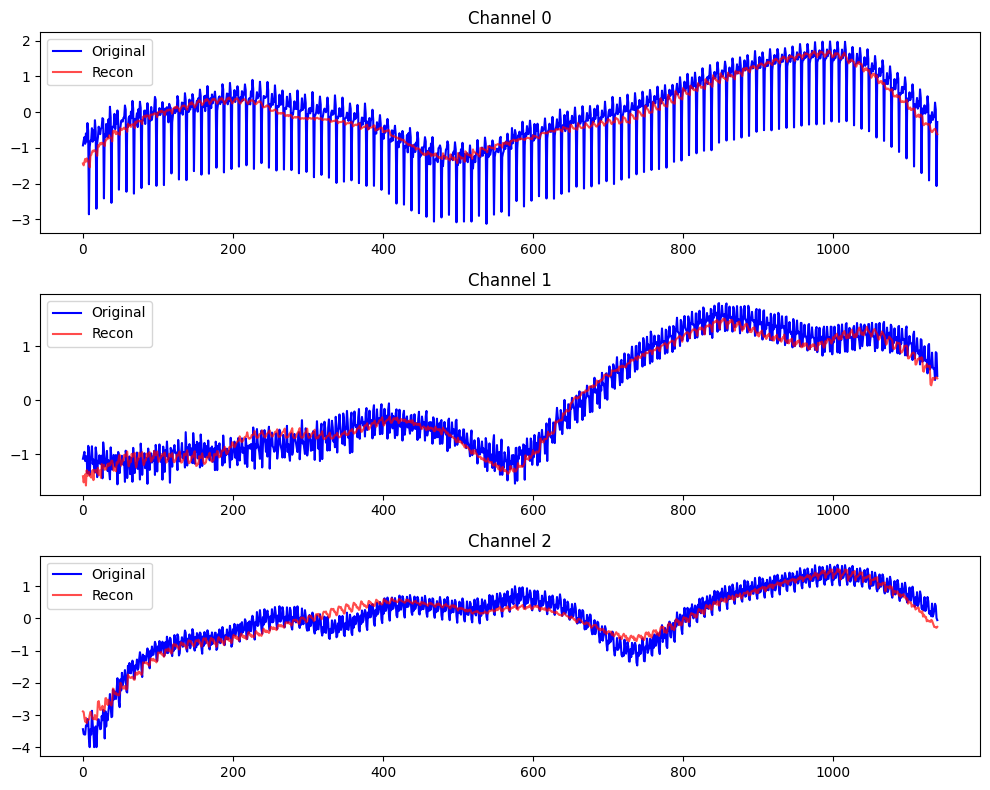

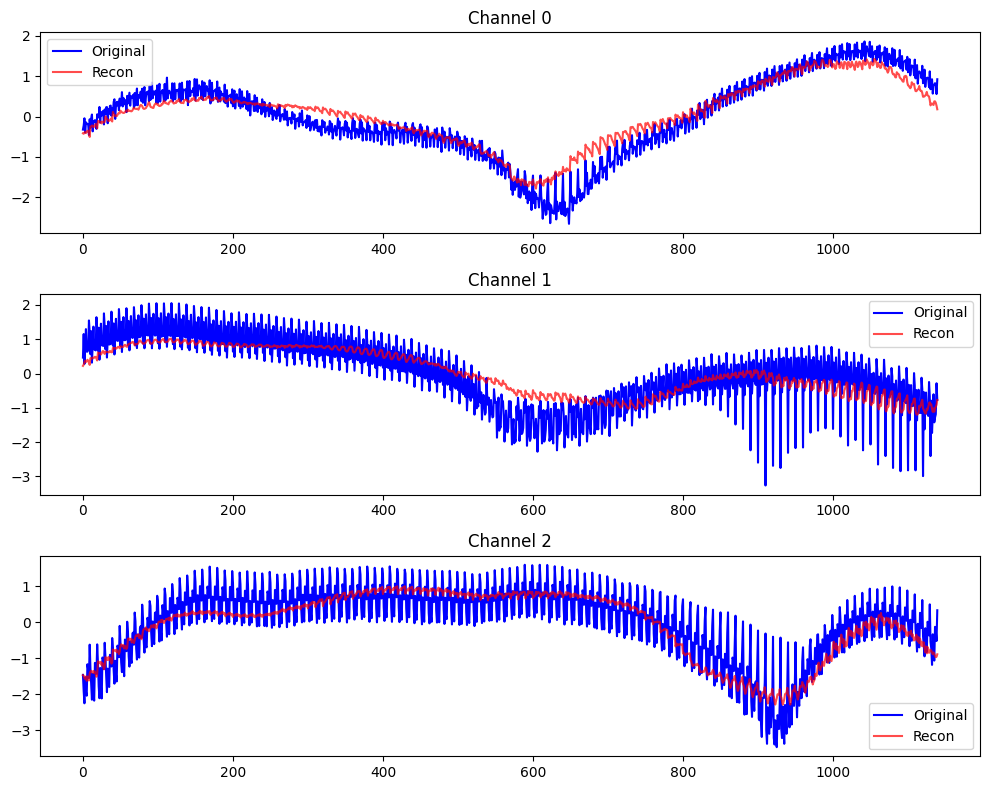

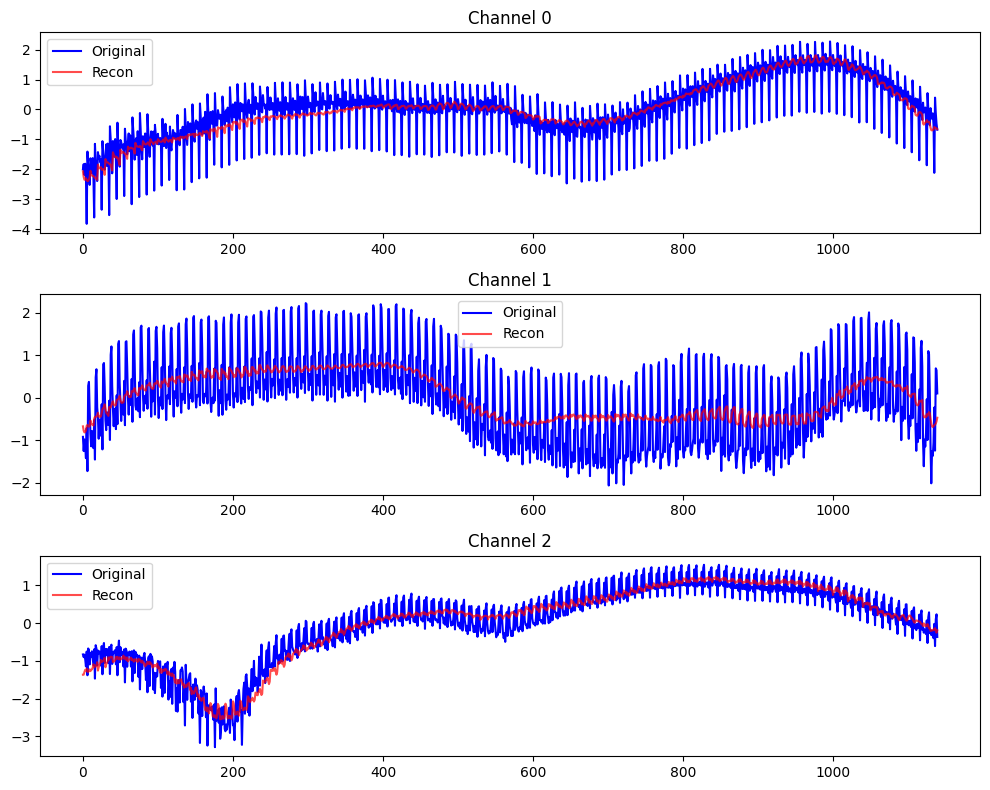

Validation loss: 0.003097
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 8/20
Train loss: 0.327715


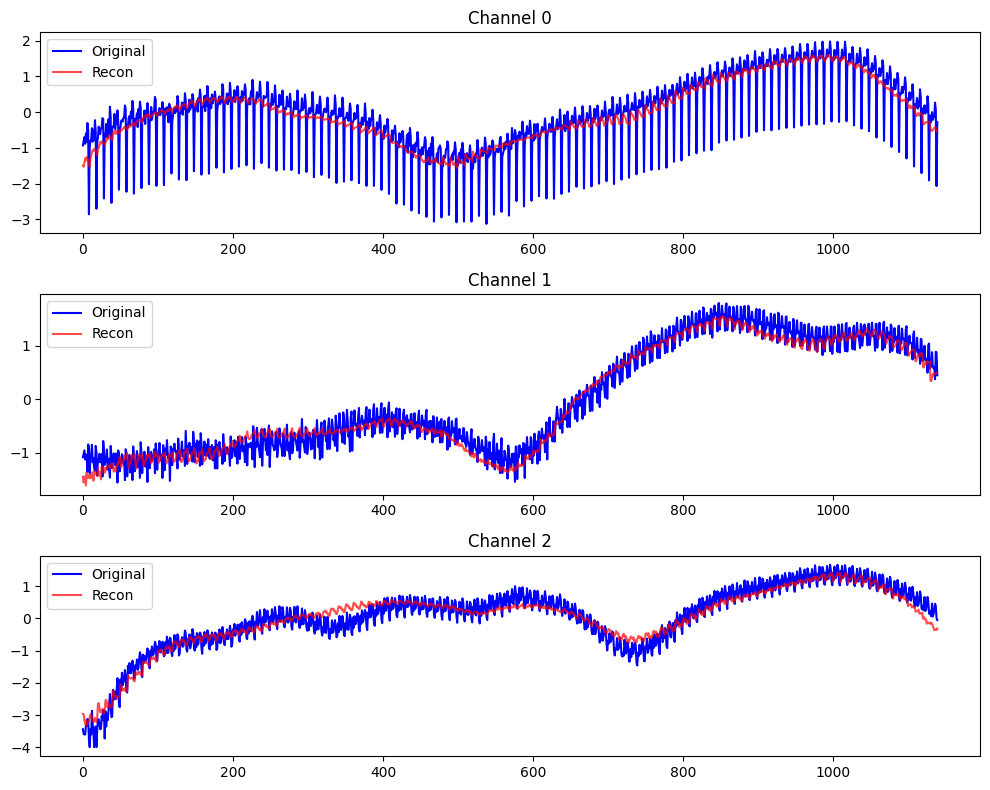

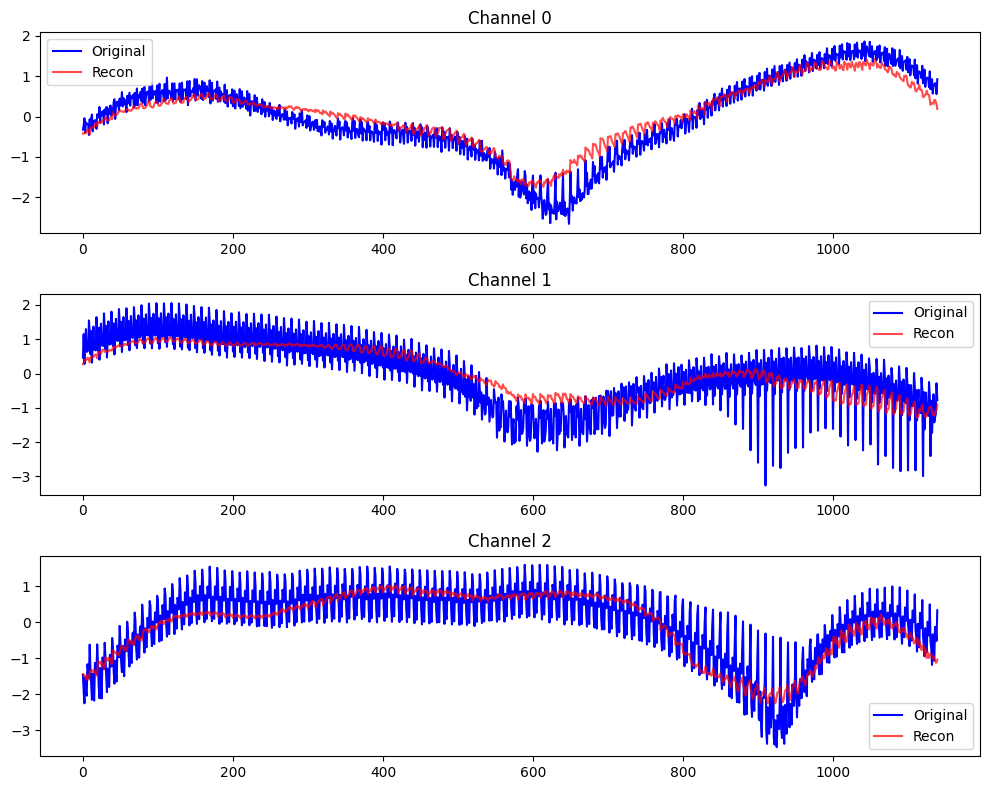

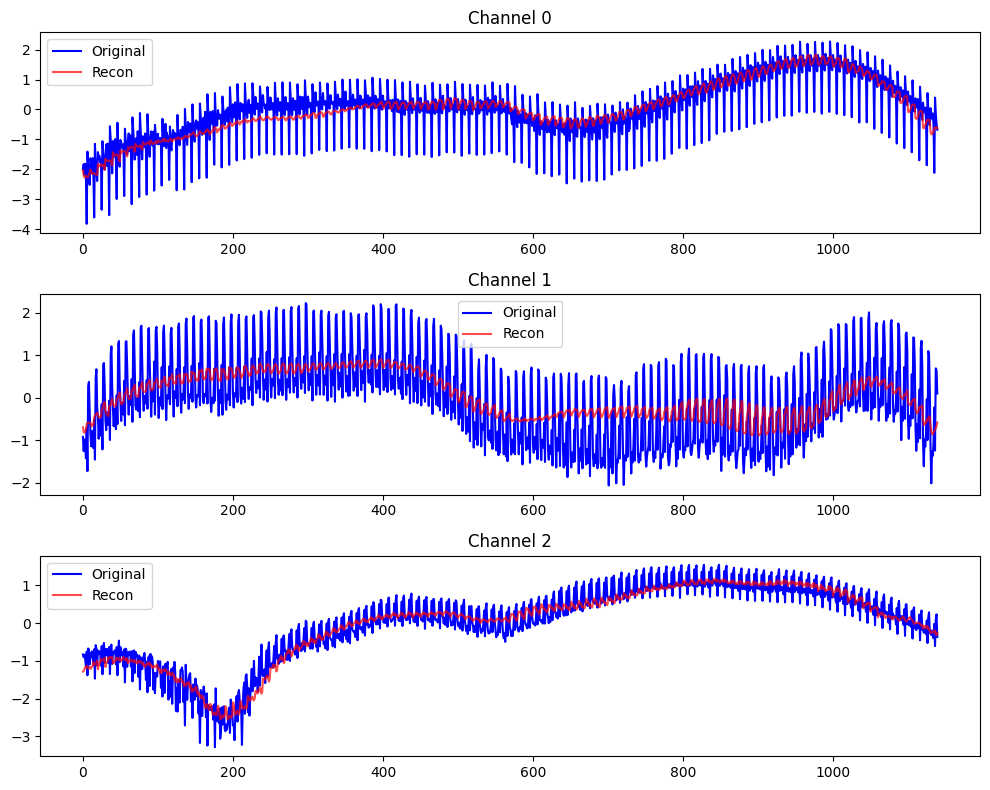

Validation loss: 0.003046
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 9/20
Train loss: 0.318371


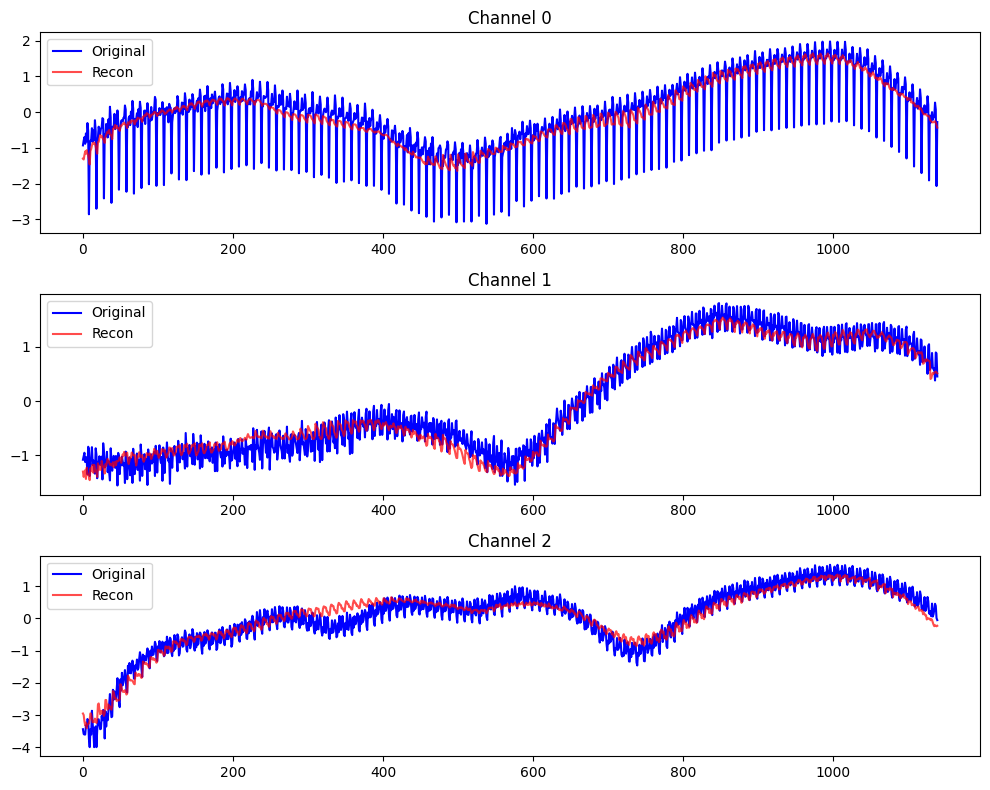

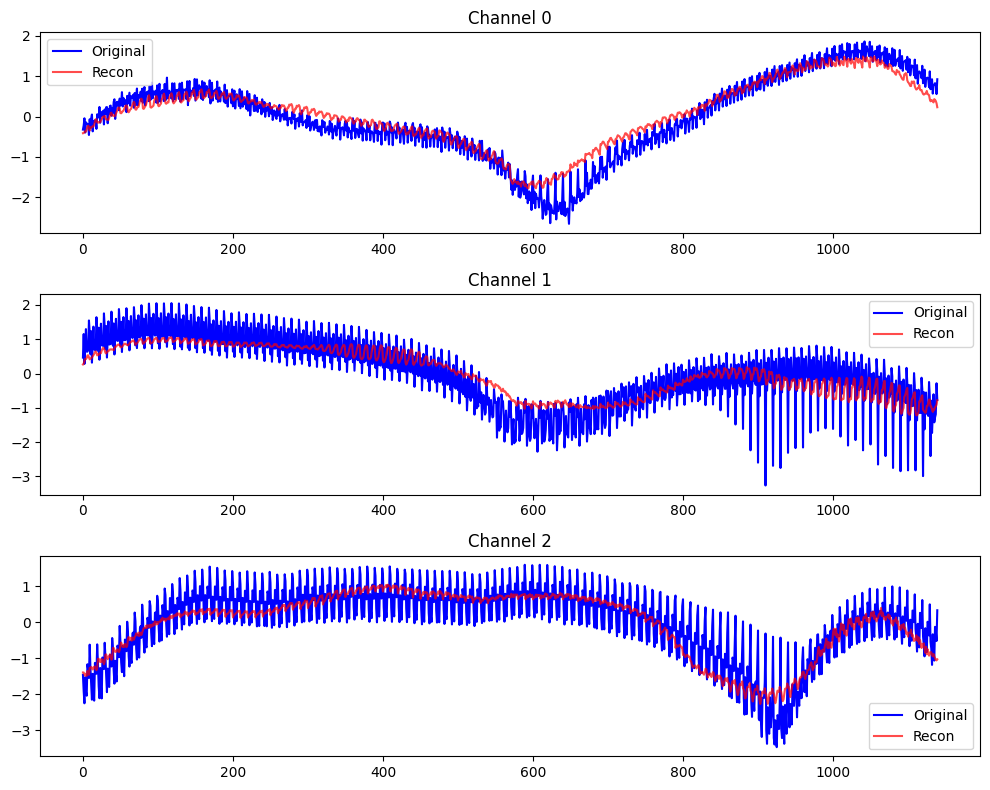

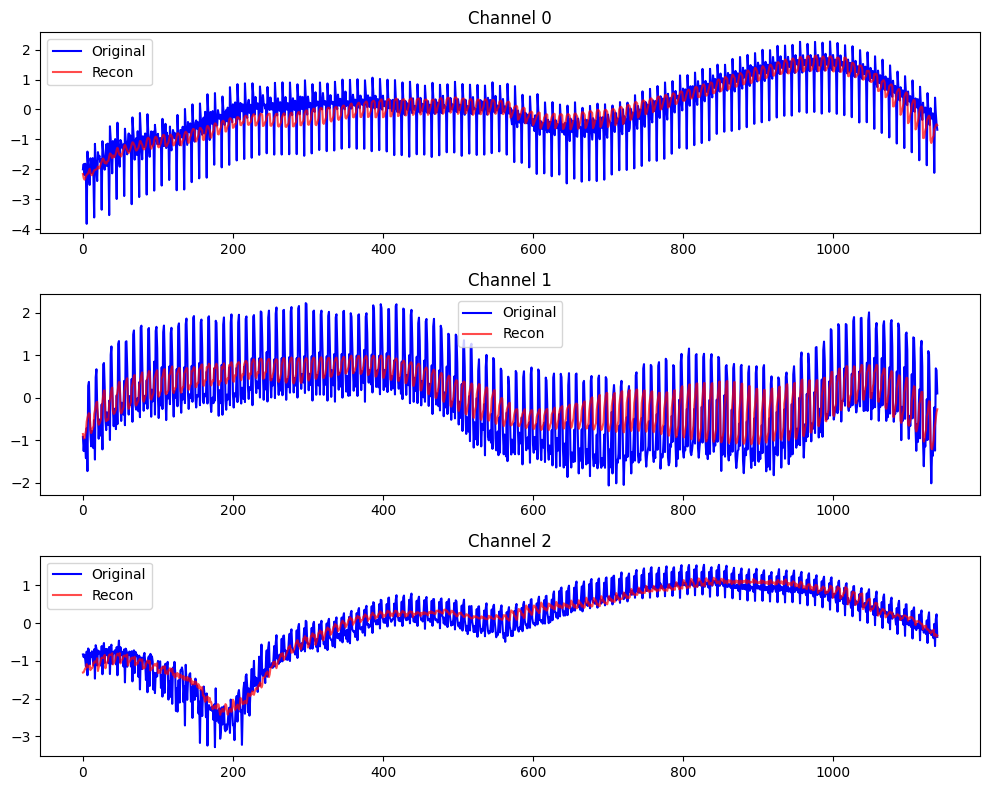

Validation loss: 0.002954
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 10/20
Train loss: 0.308620


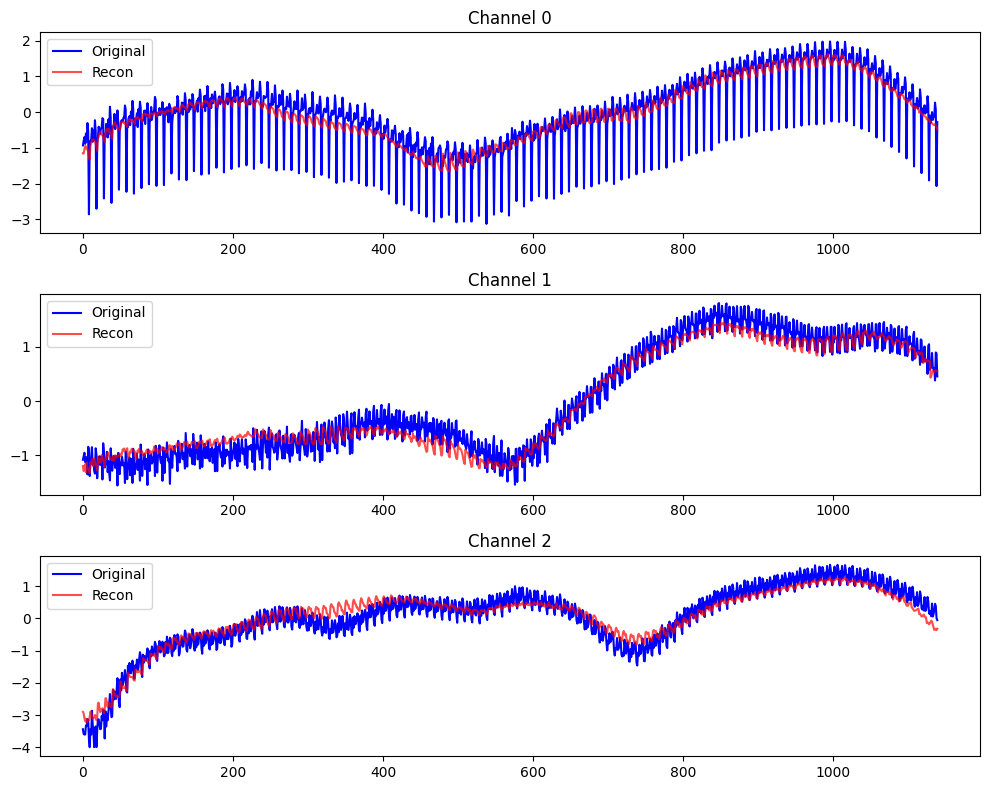

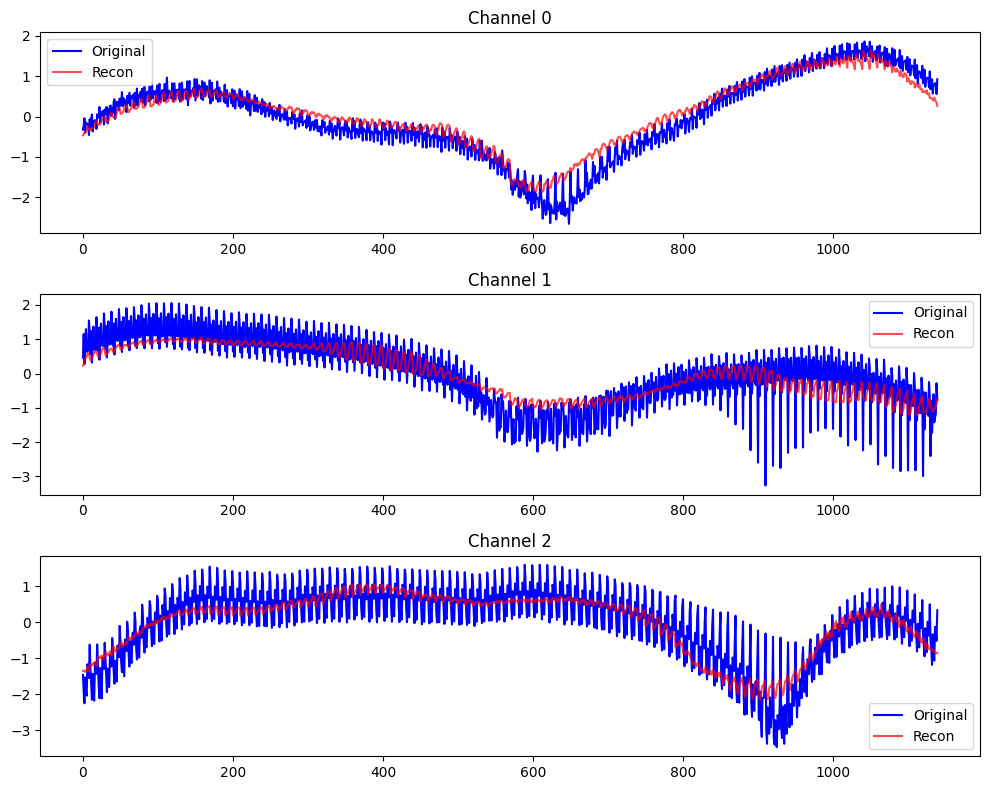

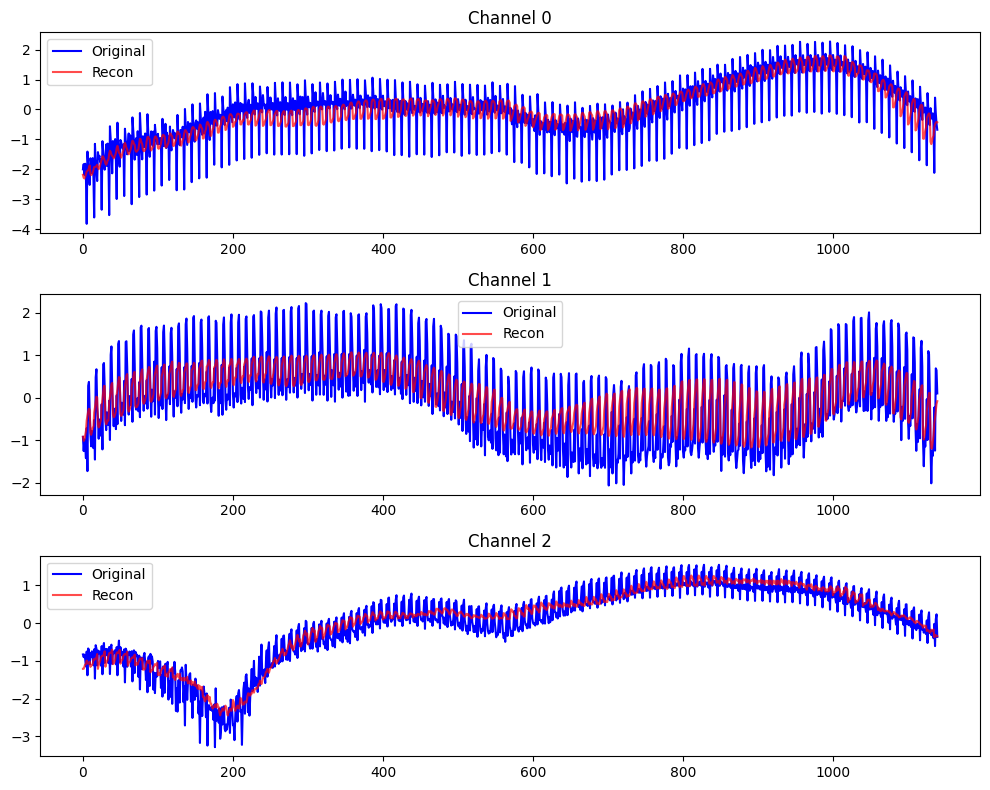

Validation loss: 0.002901
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 11/20
Train loss: 0.301232


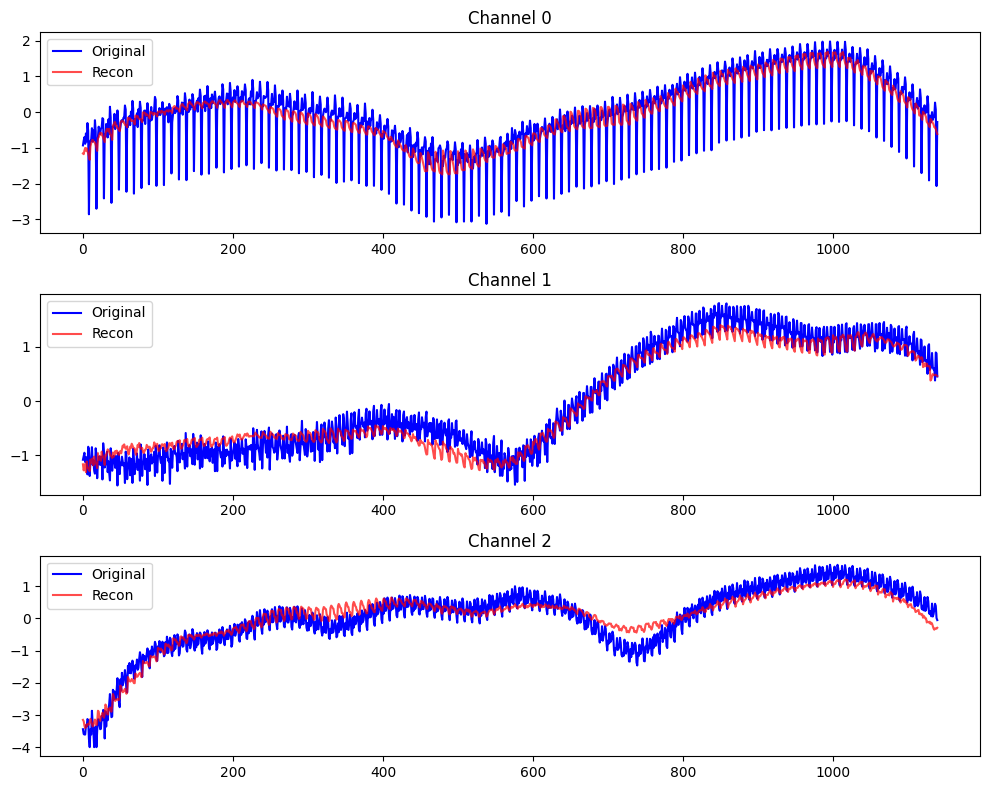

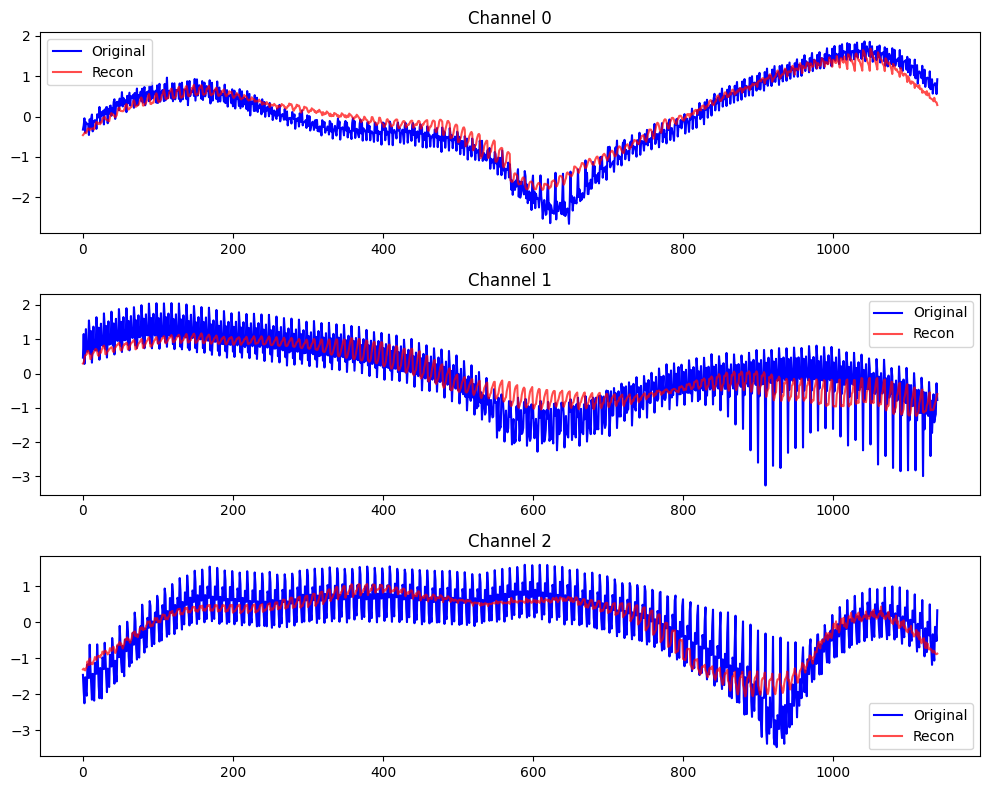

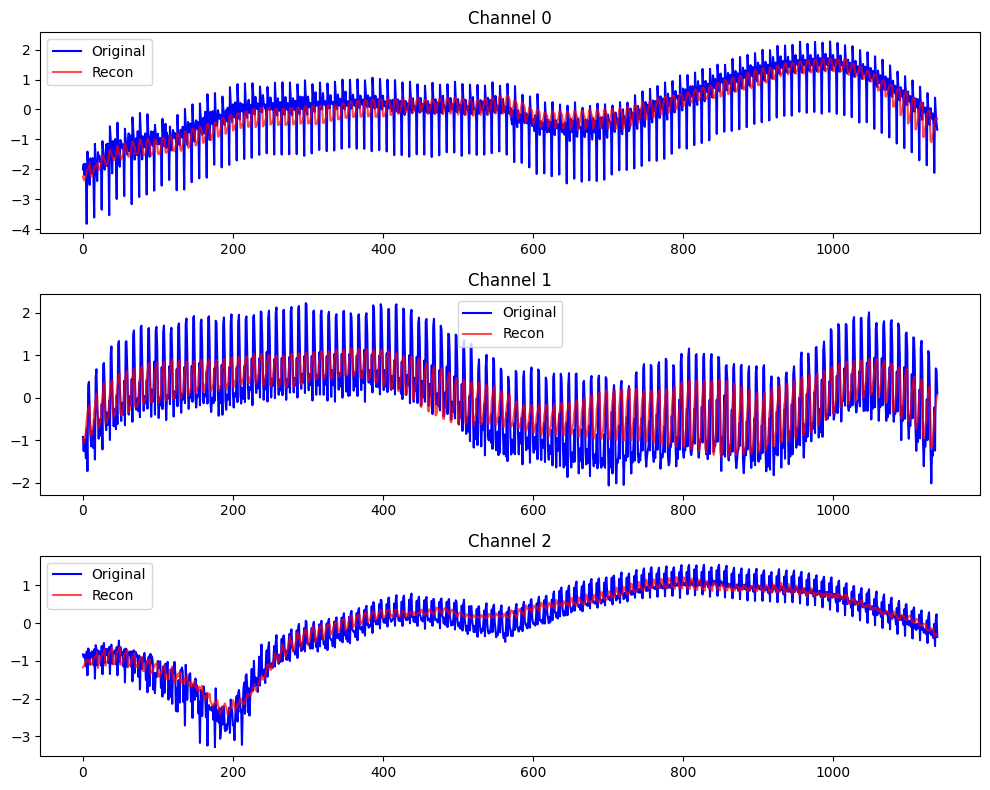

Validation loss: 0.002828
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 12/20
Train loss: 0.293053


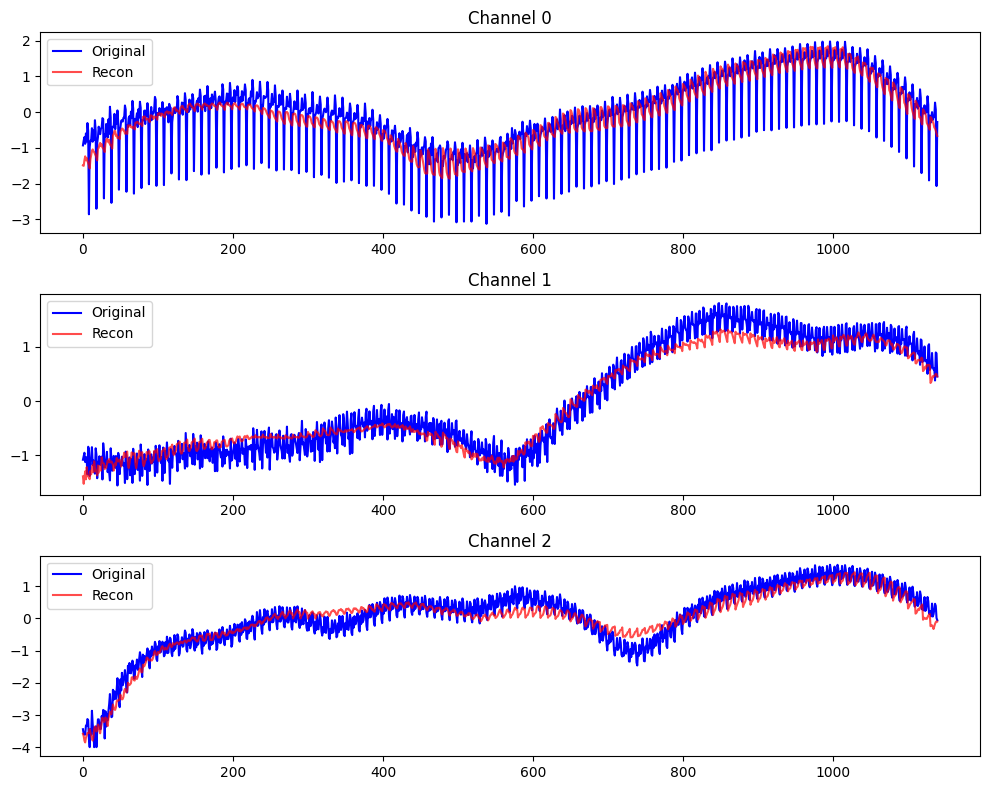

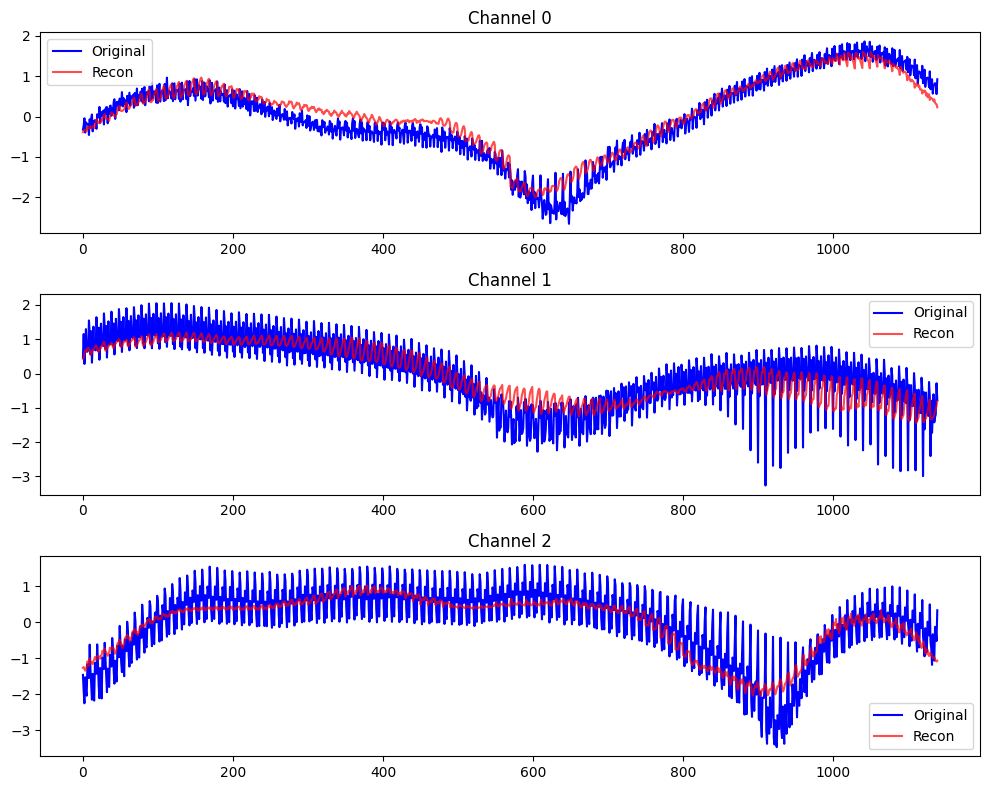

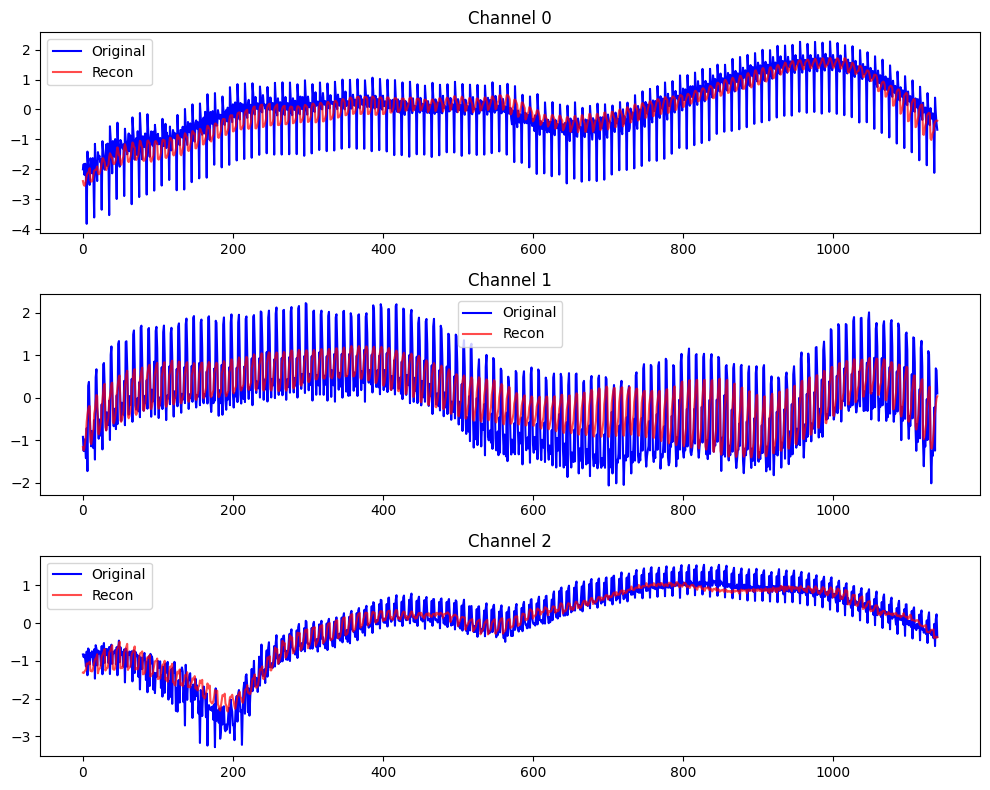

Validation loss: 0.002802
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 13/20
Train loss: 0.284924


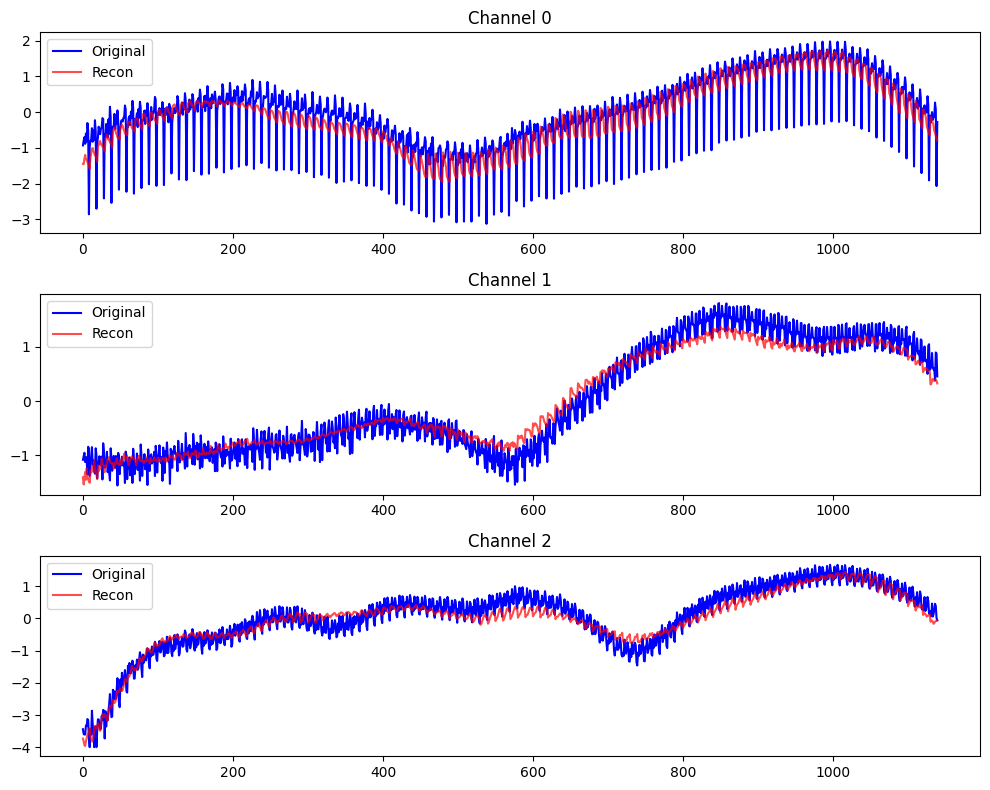

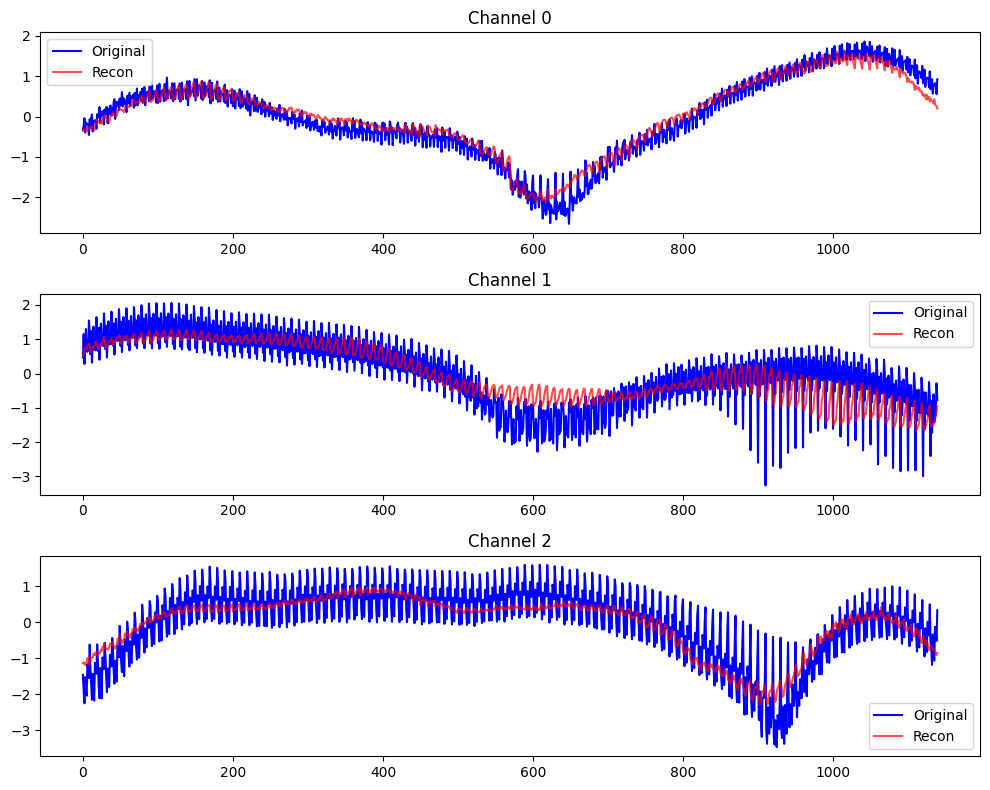

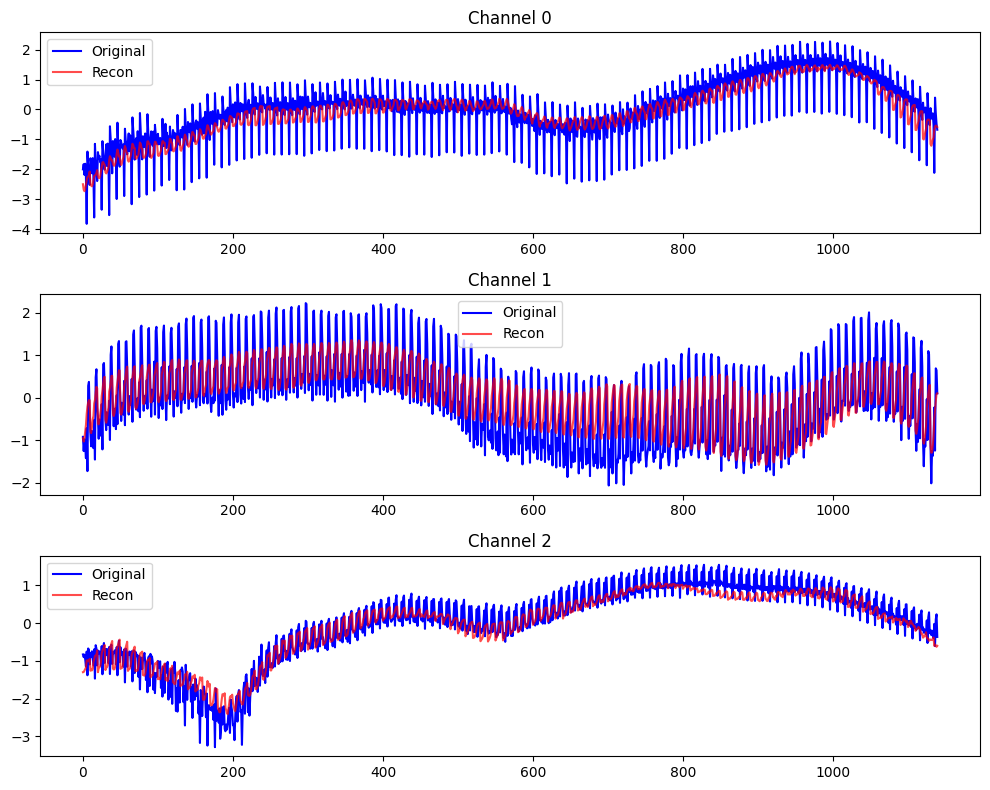

Validation loss: 0.002776
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 14/20
Train loss: 0.277515


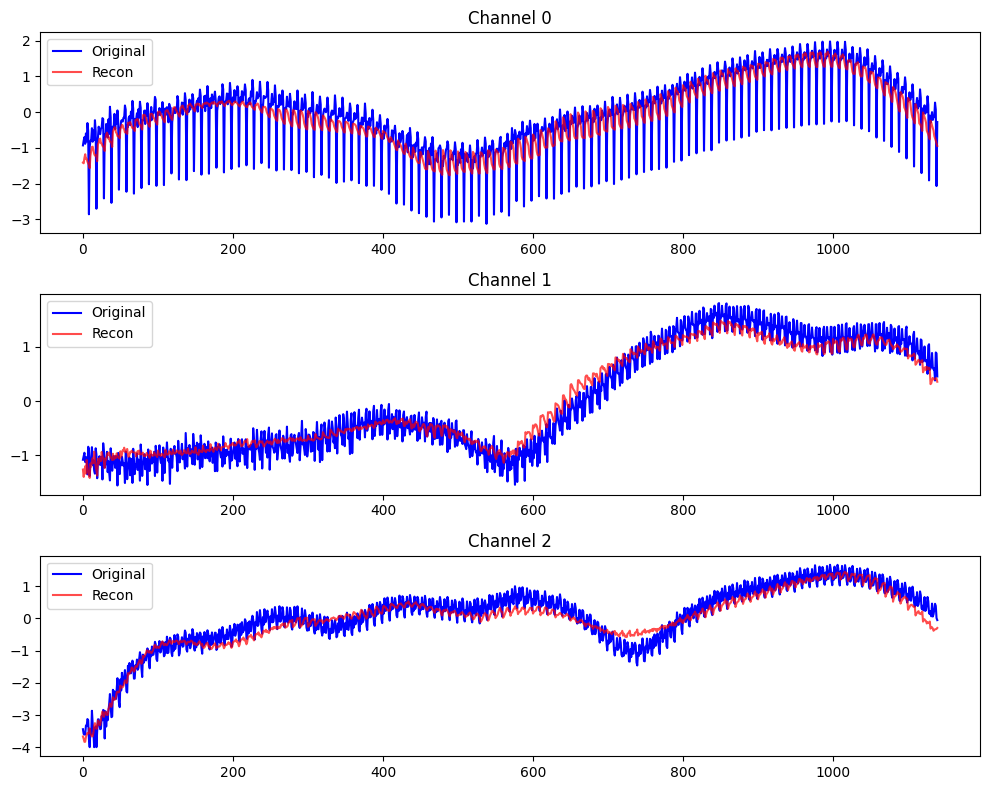

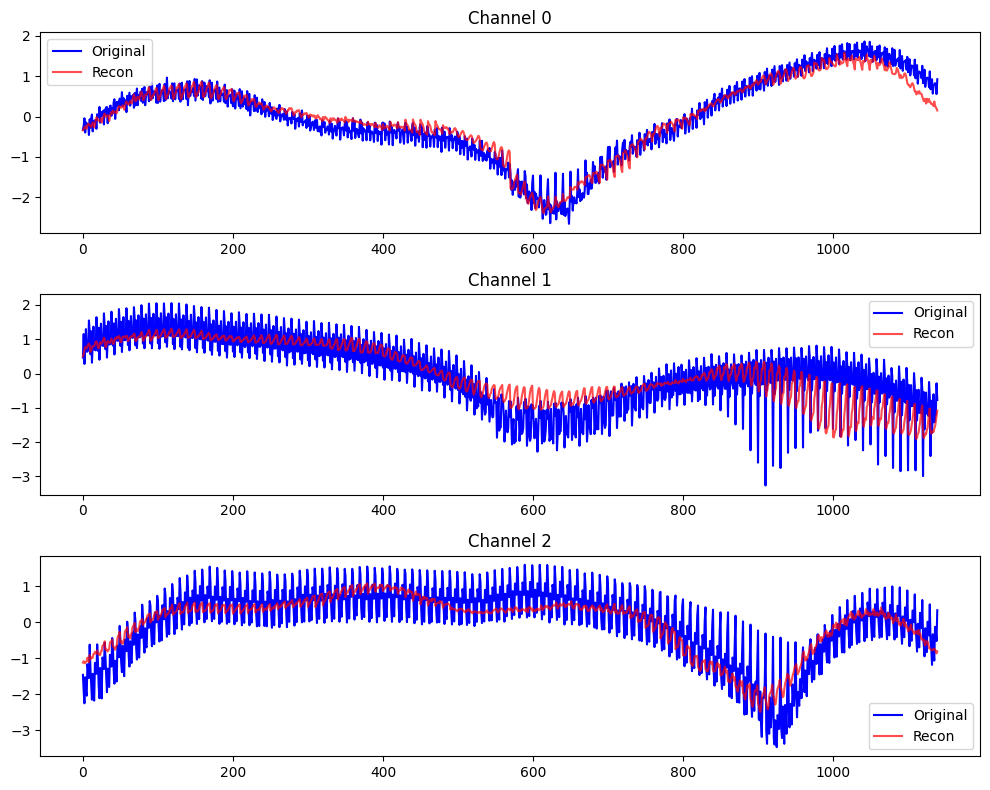

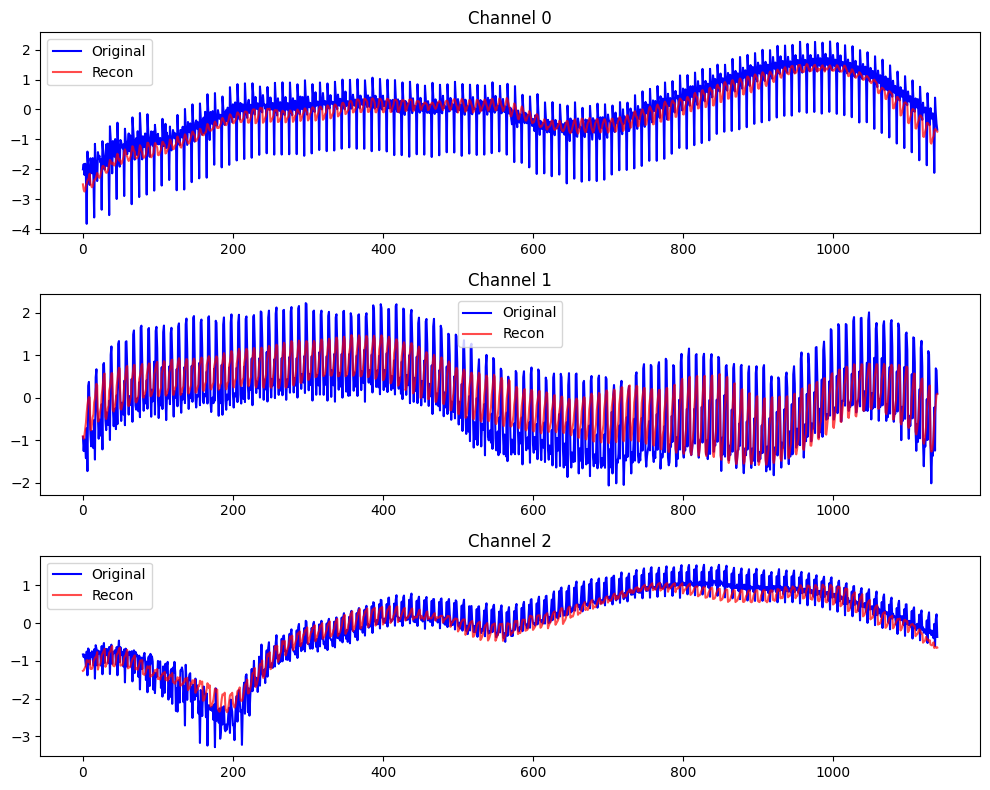

Validation loss: 0.002772
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 15/20
Train loss: 0.272921


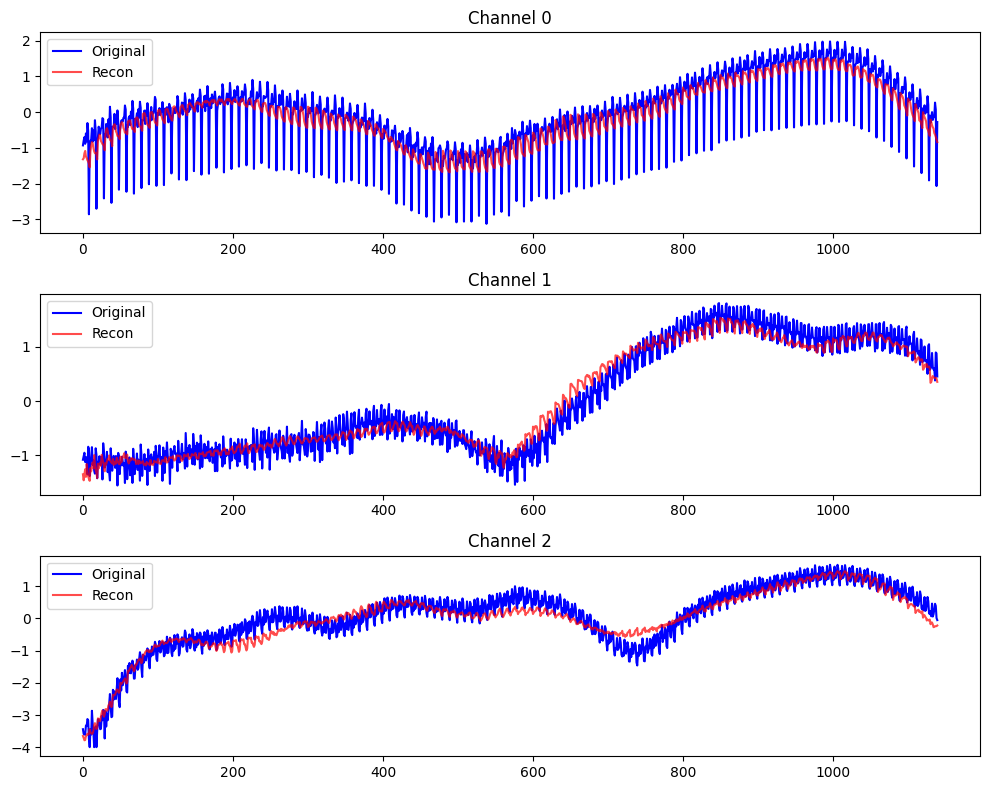

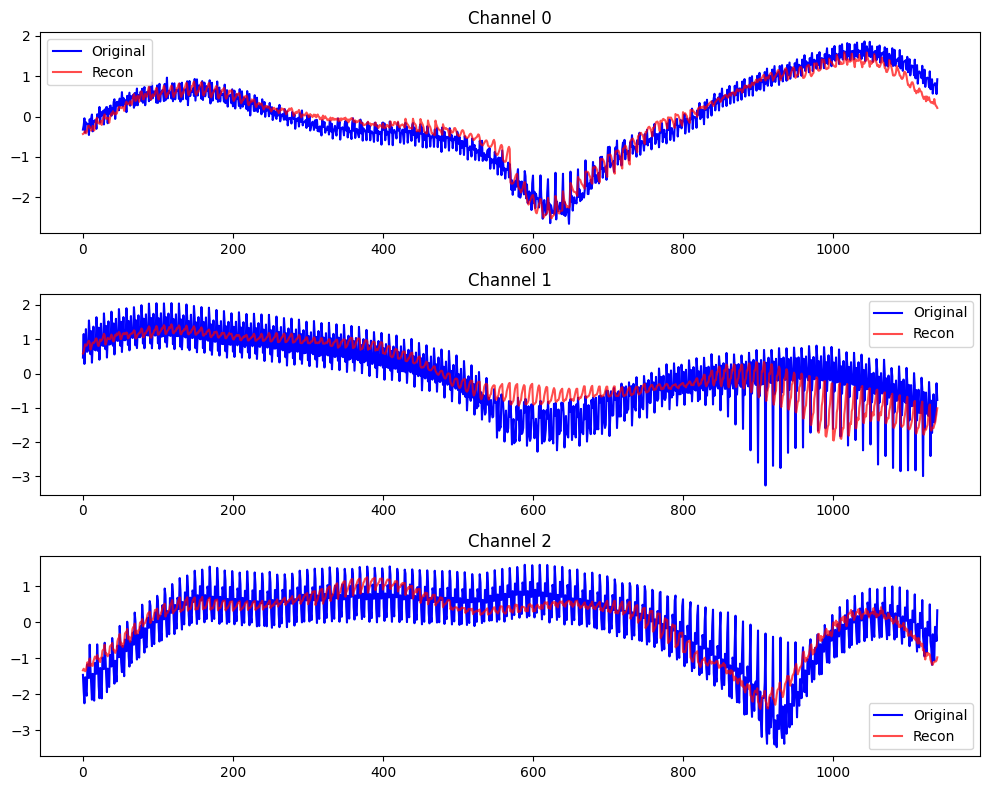

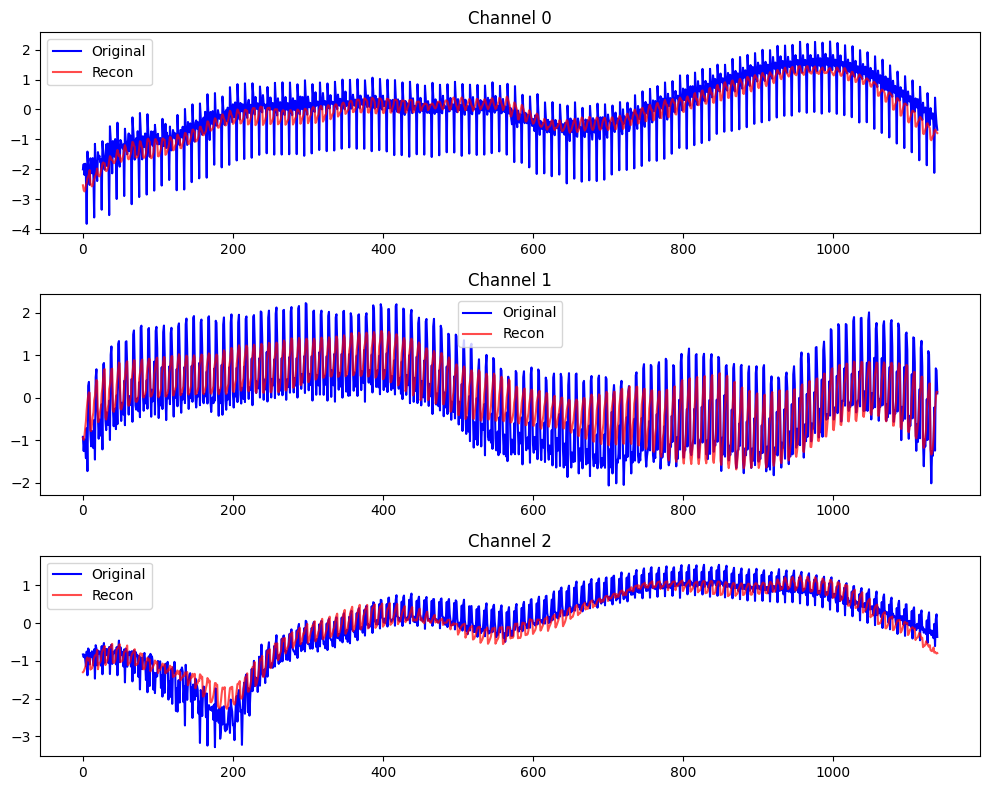

Validation loss: 0.002758
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 16/20
Train loss: 0.269126


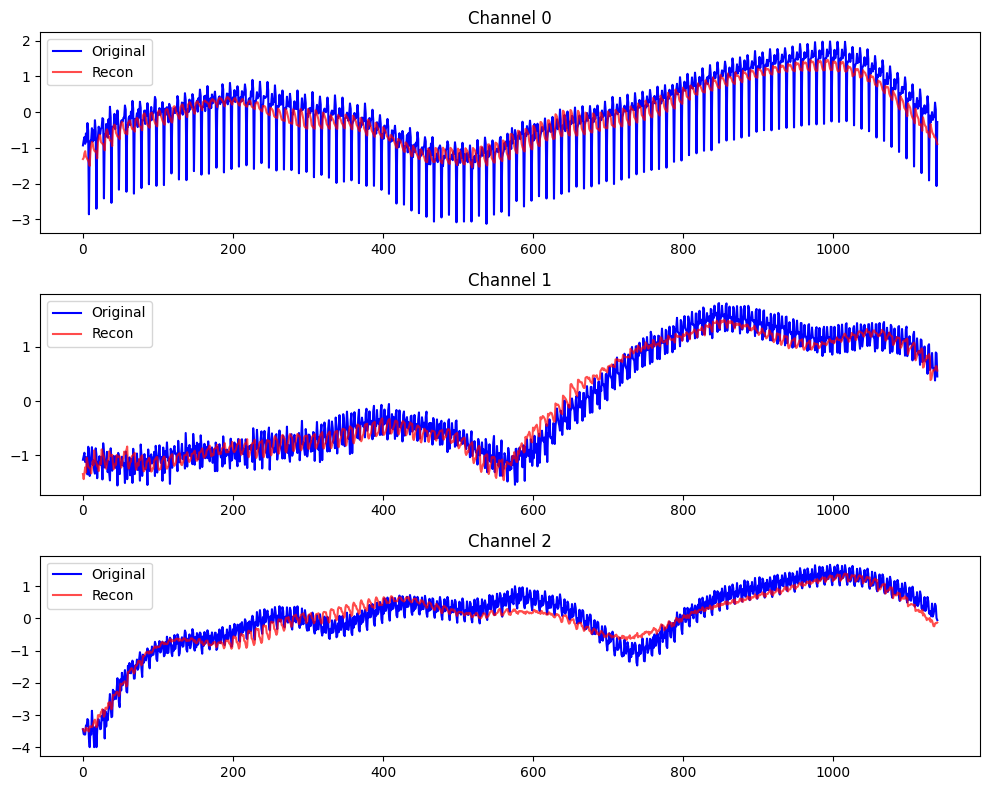

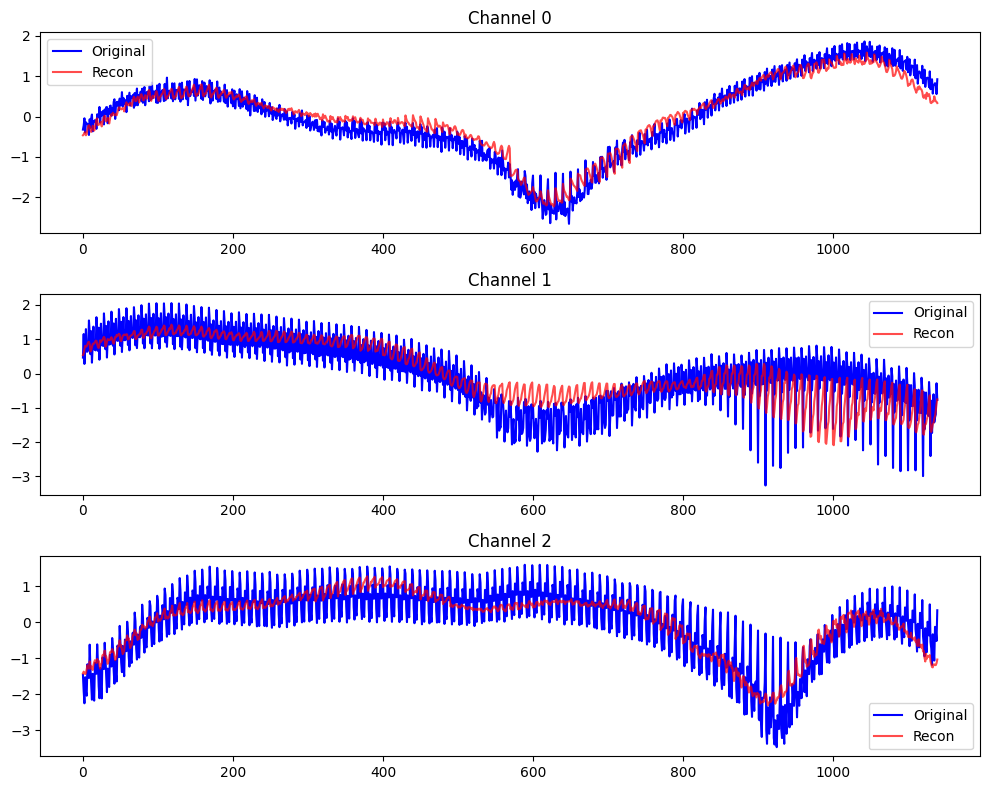

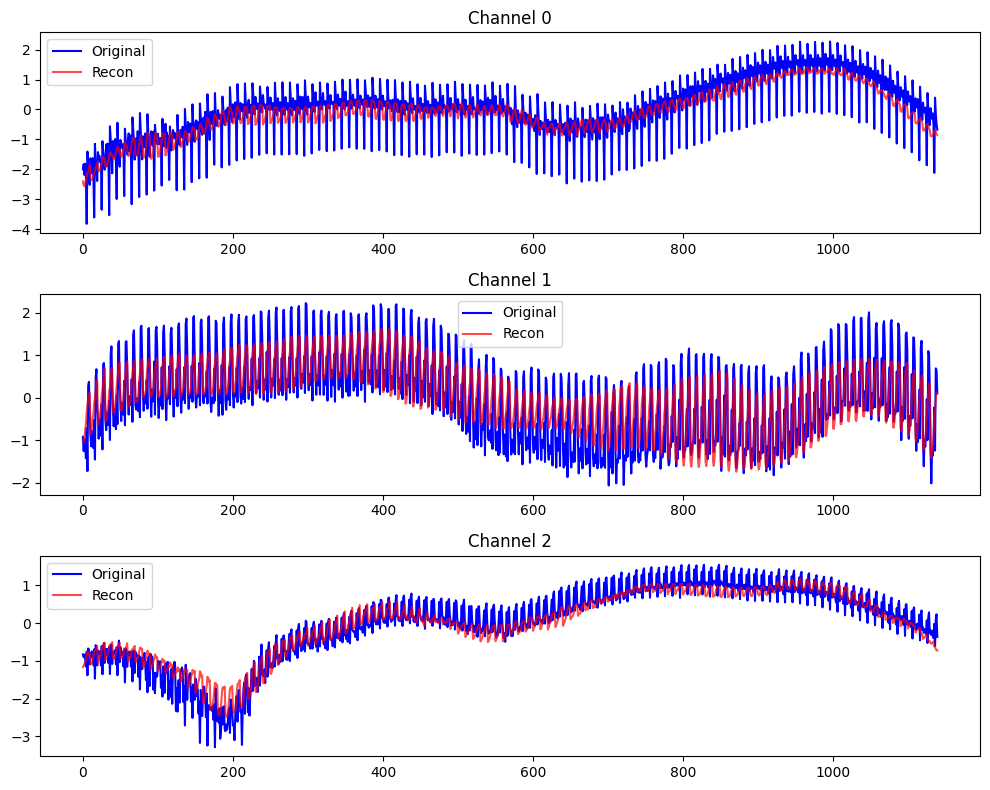

Validation loss: 0.002727
✅ Saved best_weights.pth
💾 Saved last_weights.pth

Epoch 17/20
Train loss: 0.265416


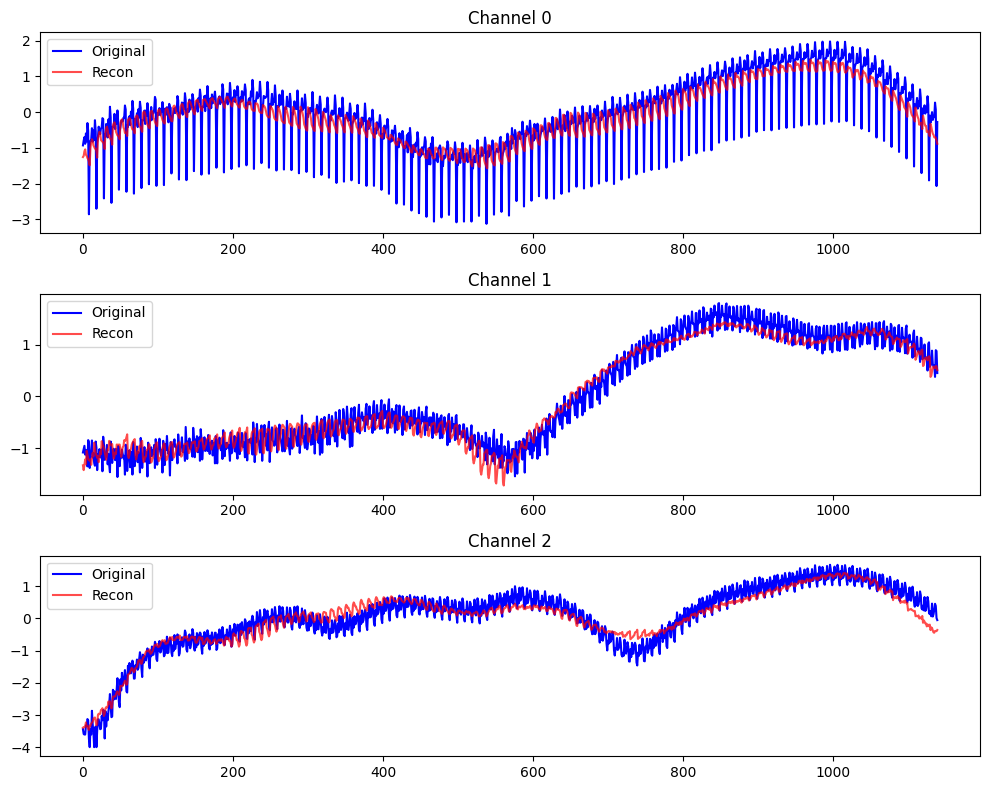

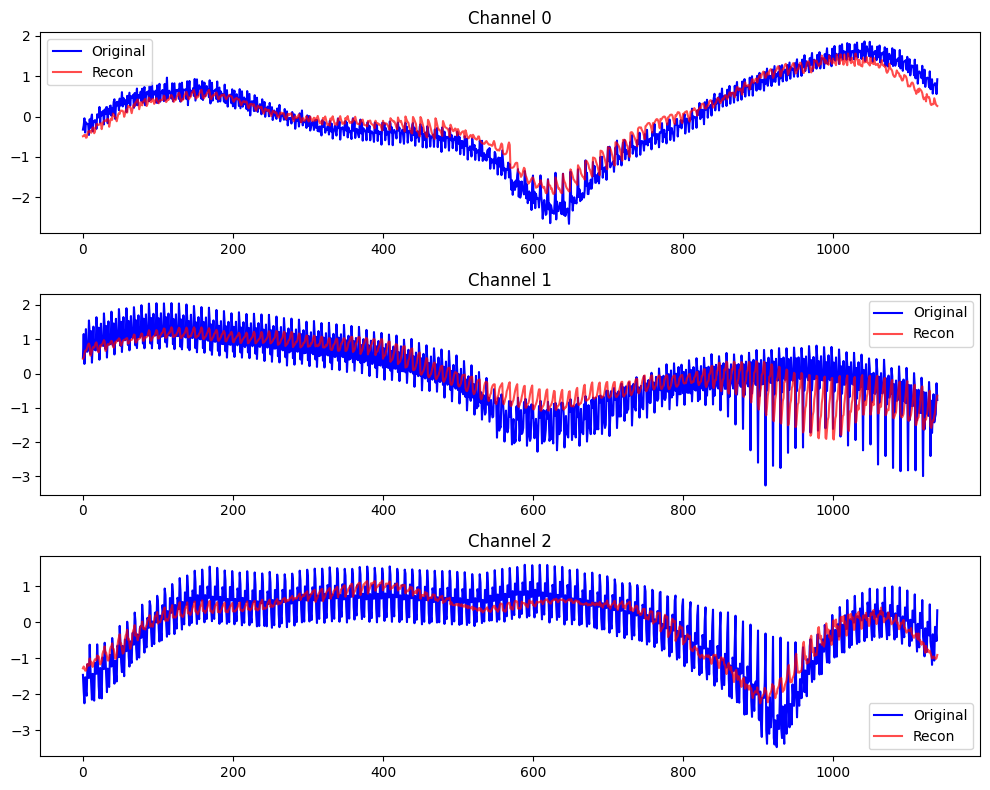

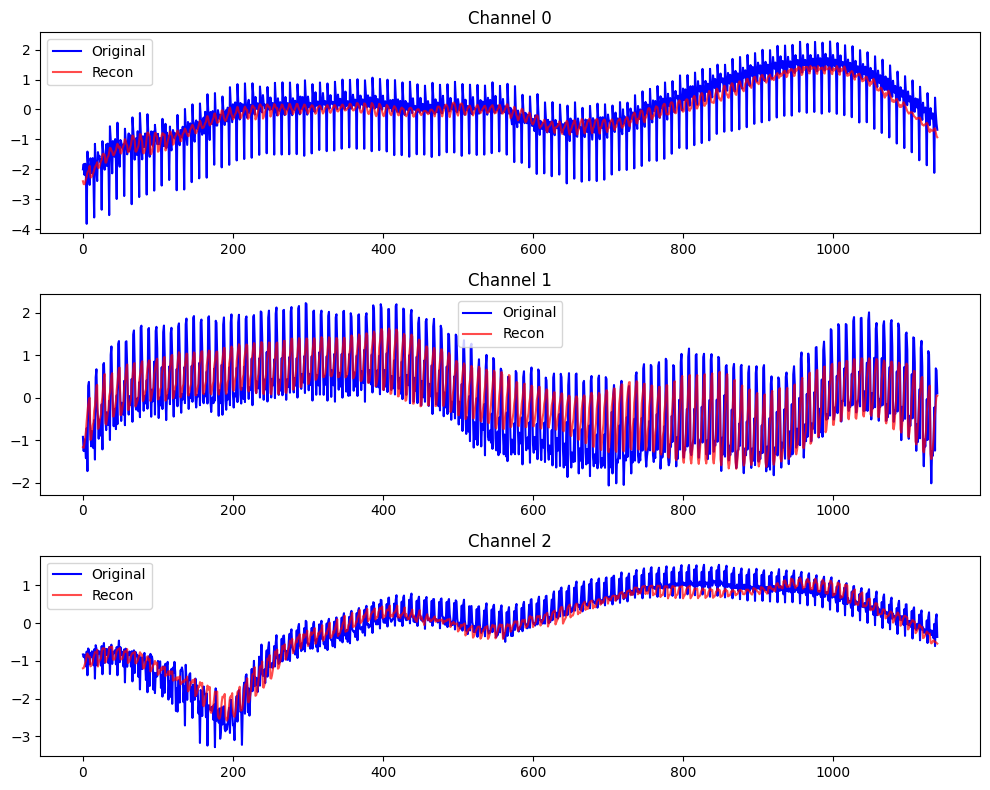

Validation loss: 0.002747
💾 Saved last_weights.pth

Epoch 18/20
Train loss: 0.261318


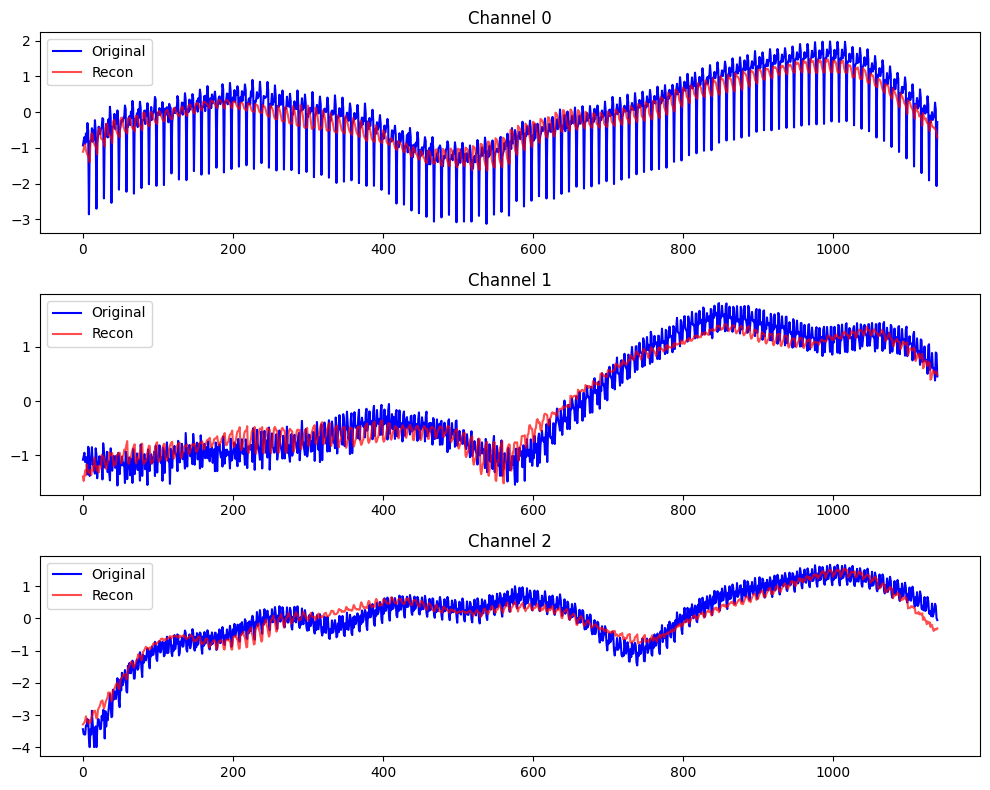

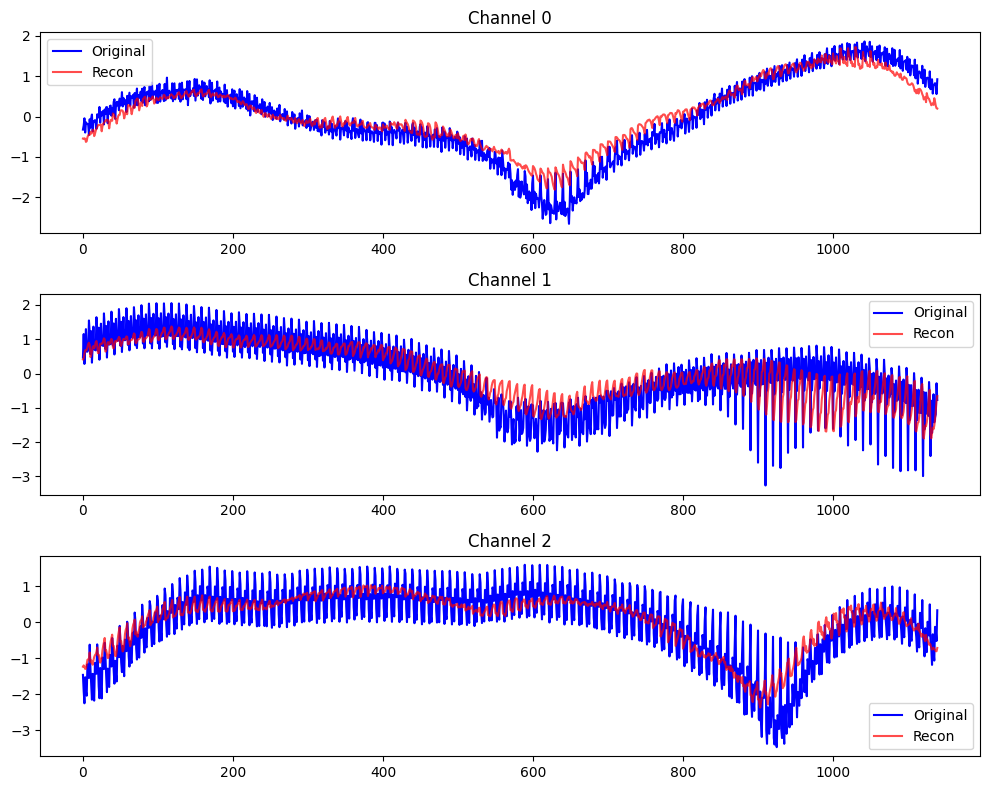

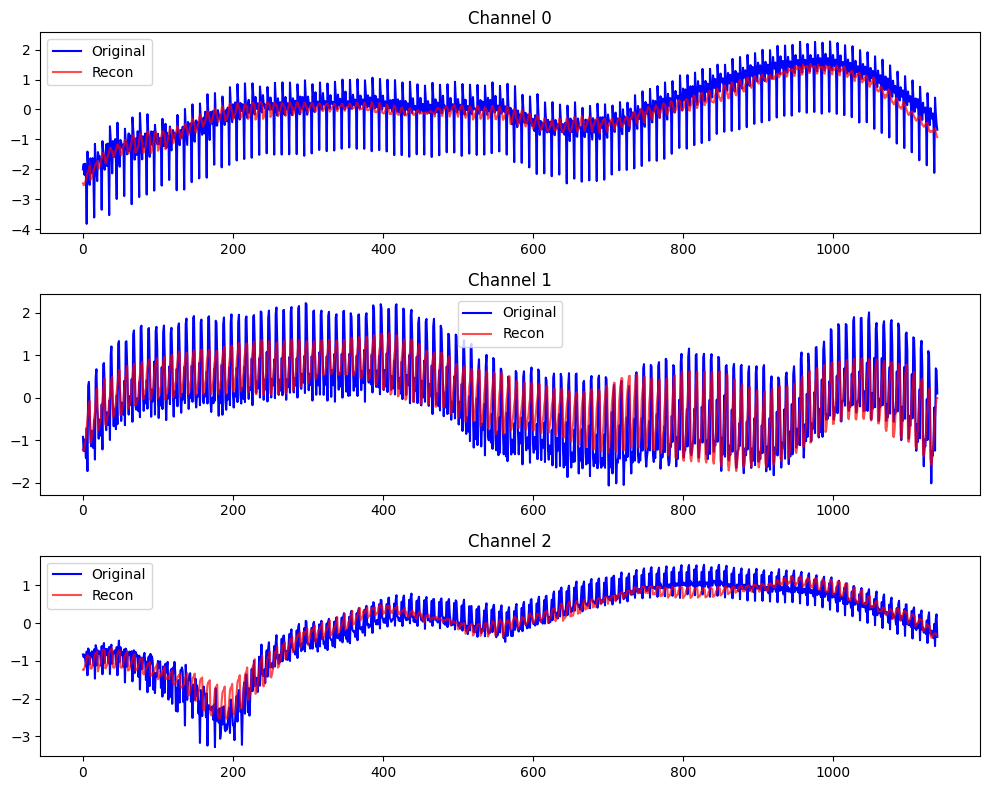

Validation loss: 0.002784
💾 Saved last_weights.pth

Epoch 19/20
Train loss: 0.258070


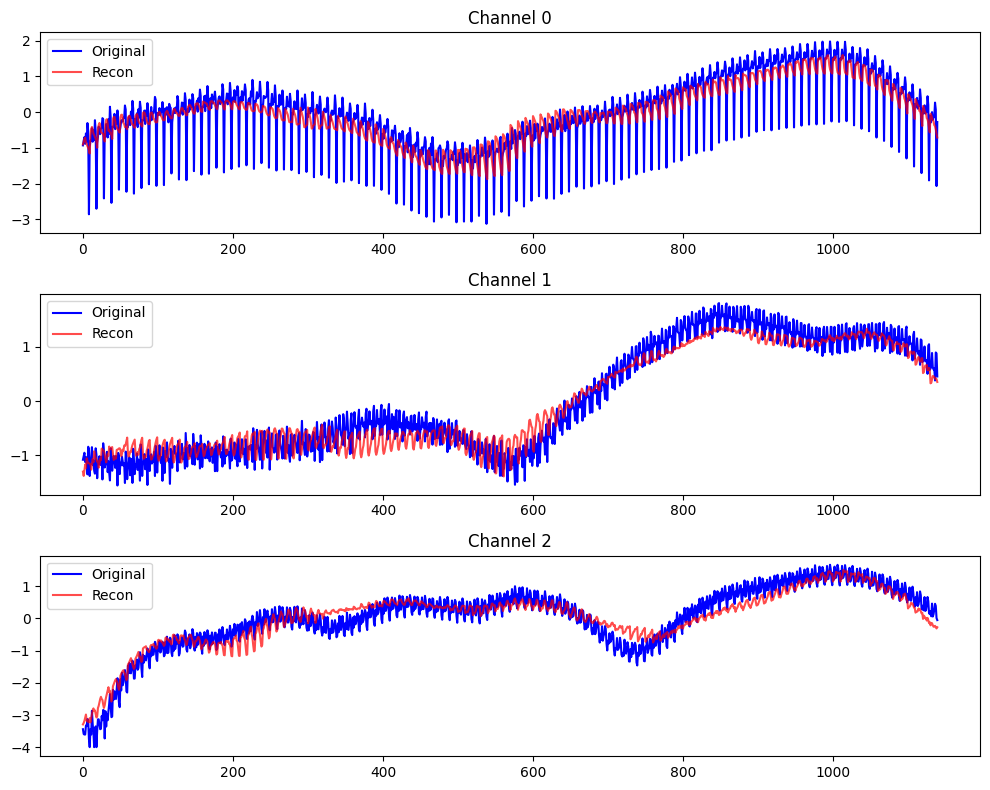

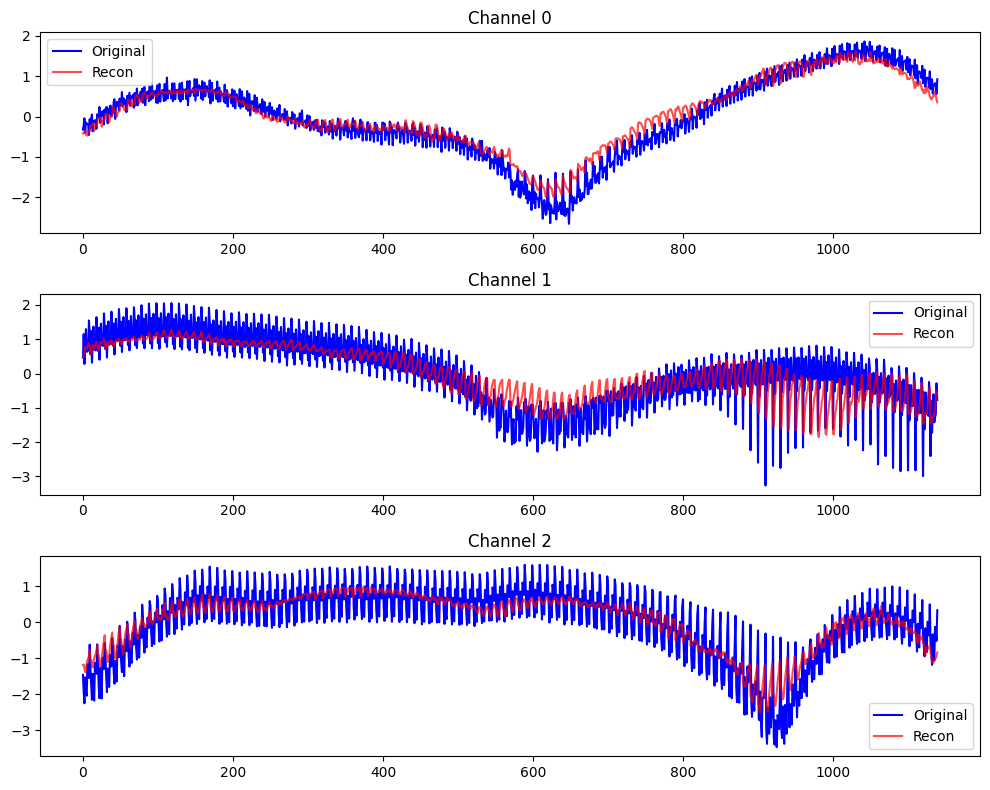

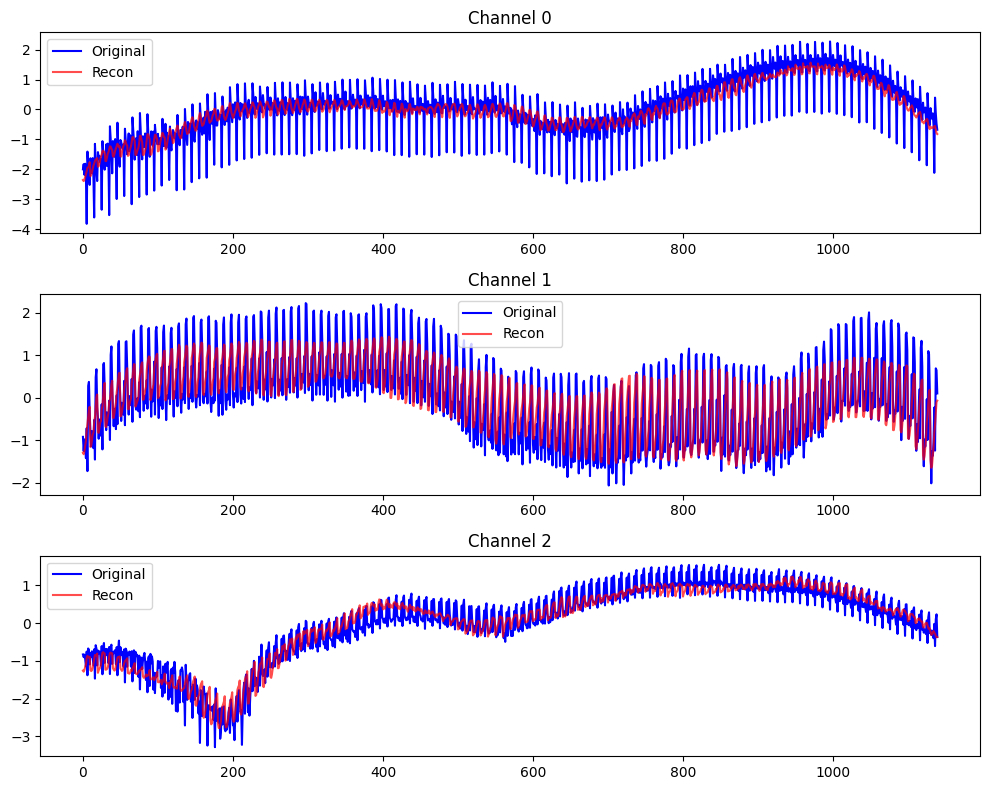

Validation loss: 0.002732
💾 Saved last_weights.pth

Epoch 20/20
Train loss: 0.253351


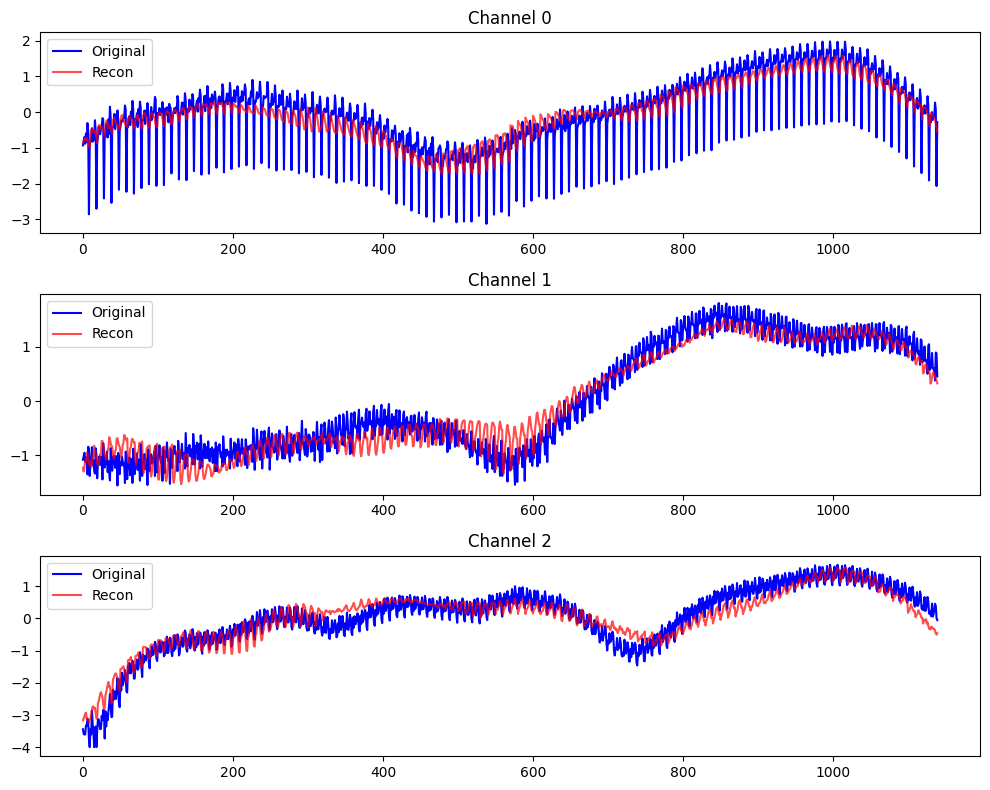

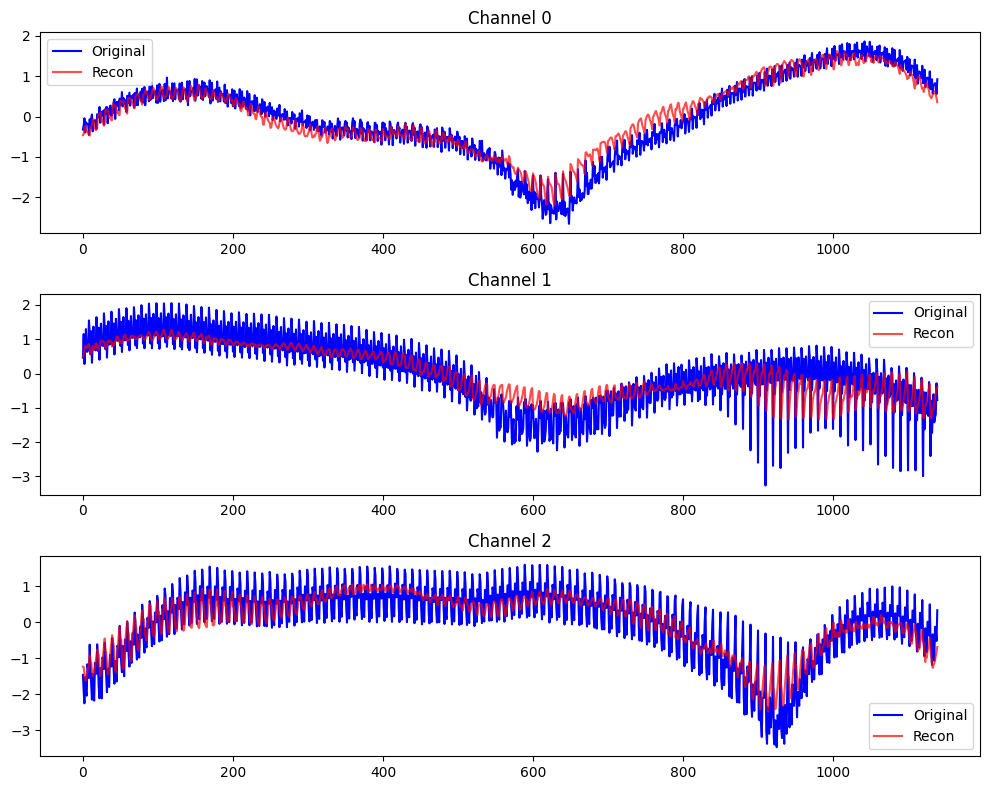

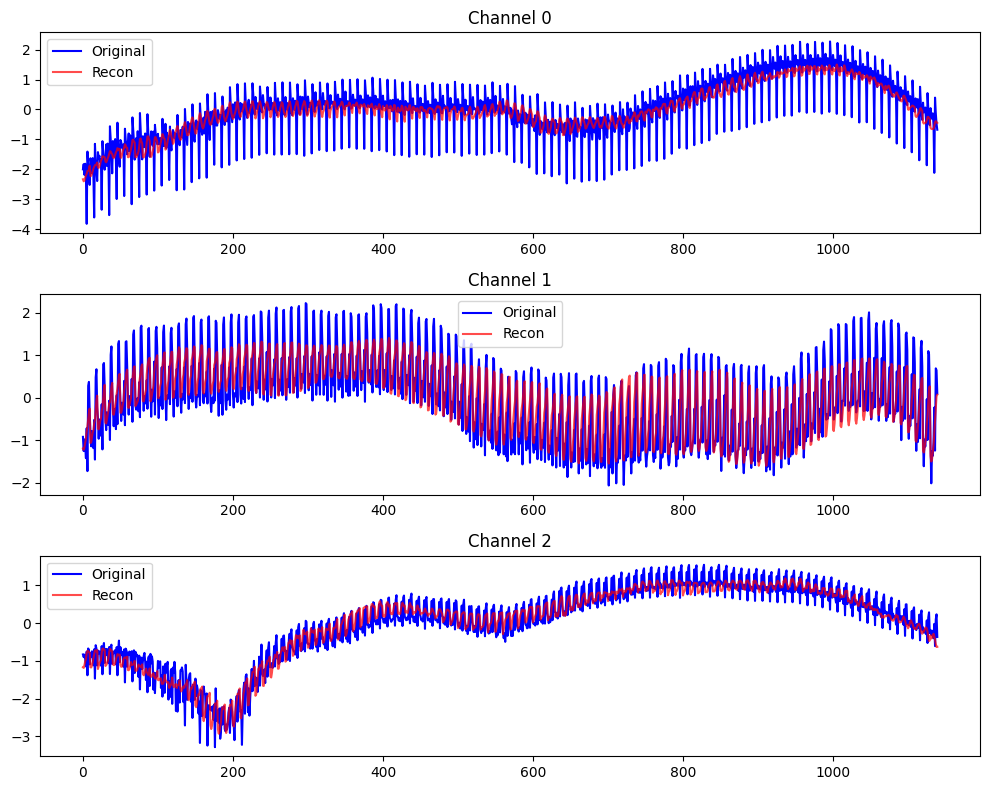

Validation loss: 0.002715
✅ Saved best_weights.pth
💾 Saved last_weights.pth


In [70]:
csi_encoder = CSIEncoder(feature_dim=256).to(device)
csi_decoder = CSIDecoder(feature_dim=256).to(device)

import os
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from tqdm import tqdm

# Giả định csi_encoder, csi_decoder, train_loader, test_loader, device đã được định nghĩa

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(
    list(csi_encoder.parameters()) + list(csi_decoder.parameters()), lr=1e-3
)

# Thư mục lưu
save_dir = "./checkpoints"
os.makedirs(save_dir, exist_ok=True)

best_val_loss = float('inf')

def train_epoch(train_loader):
    csi_encoder.train()
    csi_decoder.train()
    total_loss = 0

    for (csi_frame, _), _, _ in train_loader:
        csi_frame = csi_frame.to(device)  # [B, 3, 114, 10]

        optimizer.zero_grad()
        features = csi_encoder(csi_frame)    # [B, feature_dim]
        recon = csi_decoder(features)         # [B, 3, 114, 10]

        loss = criterion(recon, csi_frame)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * csi_frame.size(0)

    avg_loss = total_loss / len(train_loader.dataset)
    print(f"Train loss: {avg_loss:.6f}")
    return avg_loss

def evaluate_plot_and_loss(encoder, decoder, dataloader, device, num_samples=3):
    encoder.eval()
    decoder.eval()
    total_loss = 0

    with torch.no_grad():
        for (csi_frame, _), _, _ in dataloader:
            csi_frame = csi_frame.to(device)
            features = encoder(csi_frame)
            recon = decoder(features)

            loss = criterion(recon, csi_frame)
            total_loss += loss.item() * csi_frame.size(0)

            # plot first batch only
            csi_frame_cpu = csi_frame.cpu()
            recon_cpu = recon.cpu()
            for i in range(min(num_samples, csi_frame_cpu.size(0))):
                fig, axs = plt.subplots(3, 1, figsize=(10, 8))
                for ch in range(3):
                    orig = csi_frame_cpu[i, ch].flatten()
                    rec  = recon_cpu[i, ch].flatten()
                    axs[ch].plot(orig.numpy(), label="Original", color='blue')
                    axs[ch].plot(rec.numpy(), label="Recon",  color='red', alpha=0.7)
                    axs[ch].set_title(f"Channel {ch}")
                    axs[ch].legend()
                plt.tight_layout()
                plt.show()
            break

    avg_loss = total_loss / len(dataloader.dataset)
    print(f"Validation loss: {avg_loss:.6f}")
    return avg_loss

# === HUẤN LUYỆN VÀ LƯU CHECKPOINT ===
num_epochs = 20
for epoch in range(1, num_epochs+1):
    print(f"\nEpoch {epoch}/{num_epochs}")

    train_loss = train_epoch(train_loader)
    val_loss   = evaluate_plot_and_loss(csi_encoder, csi_decoder, test_loader, device)

    # Lưu best
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            'epoch': epoch,
            'encoder_state_dict': csi_encoder.state_dict(),
            'decoder_state_dict': csi_decoder.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss
        }, os.path.join(save_dir, 'best_weights.pth'))
        print("✅ Saved best_weights.pth")

    # Lưu last
    torch.save({
        'epoch': epoch,
        'encoder_state_dict': csi_encoder.state_dict(),
        'decoder_state_dict': csi_decoder.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'val_loss': val_loss
    }, os.path.join(save_dir, 'last_weights.pth'))
    print("💾 Saved last_weights.pth")

## Pretrain Image Encoder

In [71]:
class ImageEncoder(nn.Module):
    def __init__(self, input_shape=(3, 128, 128), feature_dim=256):
        super().__init__()
        self.feature_dim = feature_dim
        self.encoder = nn.Sequential(
            nn.Conv2d(input_shape[0], 32, kernel_size=3, stride=2, padding=1),  # -> [32, H/2, W/2]
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),              # -> [64, H/4, W/4]
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),             # -> [128, H/8, W/8]
            nn.BatchNorm2d(128),
            nn.ReLU(),
        )

        # Tự động suy ra kích thước input cho FC
        dummy = torch.randn(1, *input_shape)
        with torch.no_grad():
            out = self.encoder(dummy)
            flat_dim = out.view(1, -1).shape[1]

        self.flatten = nn.Flatten()
        self.fc = nn.Linear(flat_dim, feature_dim)

    def forward(self, x):
        x = self.encoder(x)
        x = self.flatten(x)
        x = self.fc(x)
        return x

In [60]:
class ImageDecoder(nn.Module):
    def __init__(self, feature_dim=256, output_shape=(3, 480, 640)):
        super().__init__()
        self.output_shape = output_shape

        self.fc = nn.Sequential(
            nn.Linear(feature_dim, 256 * 30 * 40),
            nn.ReLU()
        )

        self.decoder = nn.Sequential(
            nn.Unflatten(1, (256, 30, 40)),

            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), # (128, 60, 80)
            nn.ReLU(),

            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),  # (64, 120, 160)
            nn.ReLU(),

            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1),   # (32, 240, 320)
            nn.ReLU(),

            nn.ConvTranspose2d(32, 3, 4, stride=2, padding=1),    # (3, 480, 640)
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.fc(x)
        x = self.decoder(x)
        return x

Epoch 1/20 [Train]: 100%|██████████| 378/378 [01:01<00:00,  6.16it/s]

Epoch 1 - Train Loss: 0.3420


Epoch 1 - Val Loss: 0.2934


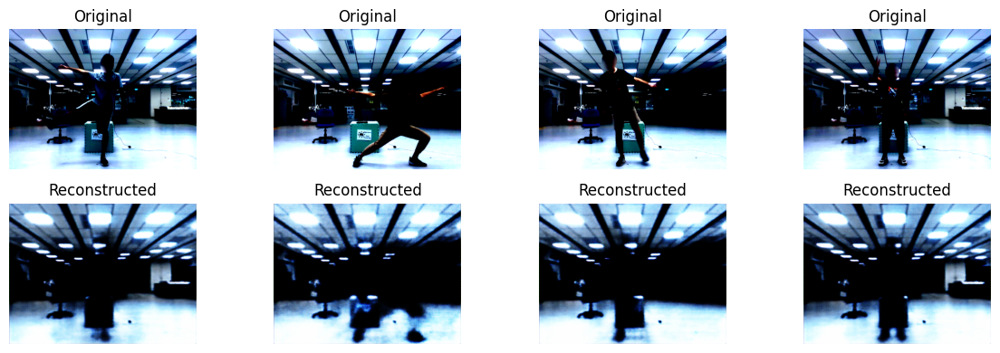

Epoch 2/20 [Train]: 100%|██████████| 378/378 [01:02<00:00,  6.03it/s]

Epoch 2 - Train Loss: 0.2874


Epoch 2 - Val Loss: 0.2876


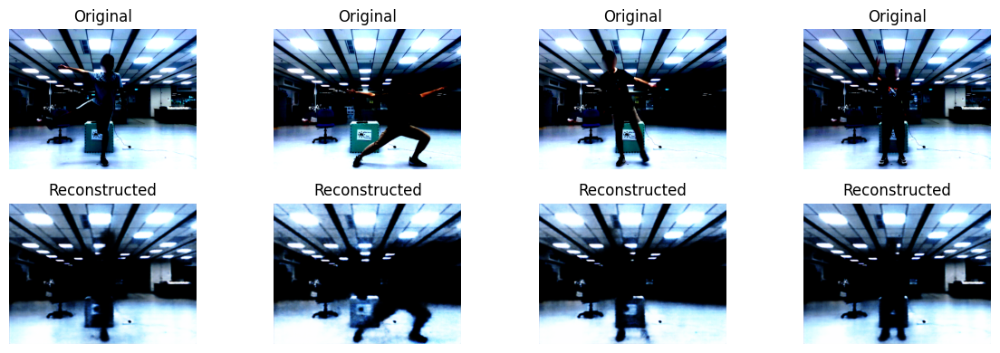

Epoch 3/20 [Train]: 100%|██████████| 378/378 [01:02<00:00,  6.07it/s]

Epoch 3 - Train Loss: 0.2835


Epoch 3 - Val Loss: 0.2849


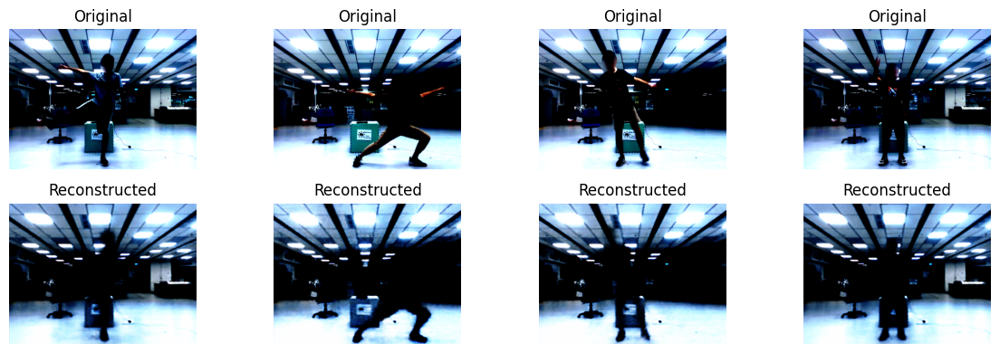

Epoch 4/20 [Train]: 100%|██████████| 378/378 [01:03<00:00,  5.99it/s]


Epoch 4 - Train Loss: 0.2815
Epoch 4 - Val Loss: 0.2833


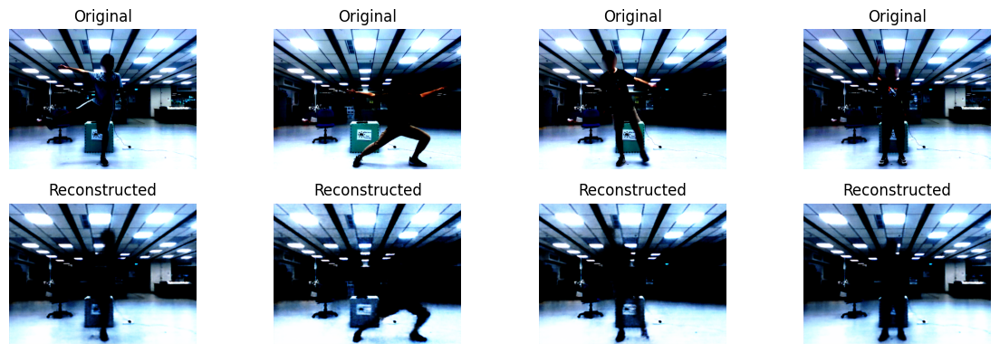

Epoch 5/20 [Train]: 100%|██████████| 378/378 [01:02<00:00,  6.08it/s]

Epoch 5 - Train Loss: 0.2802


Epoch 5 - Val Loss: 0.2824


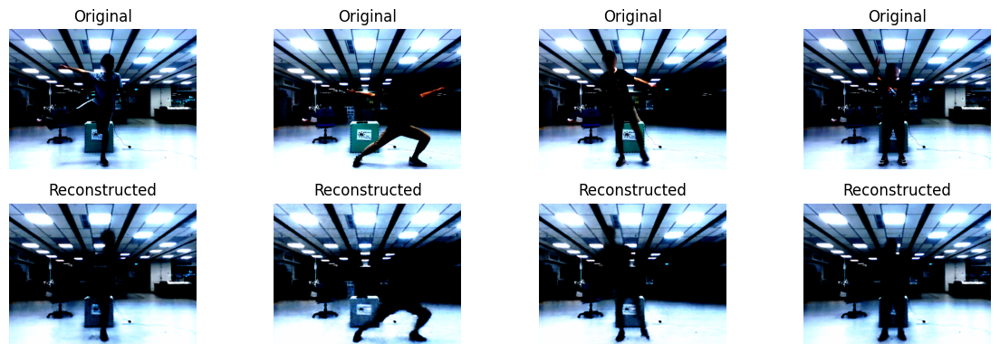

Epoch 6/20 [Train]: 100%|██████████| 378/378 [01:03<00:00,  5.99it/s]

Epoch 6 - Train Loss: 0.2794


Epoch 6 - Val Loss: 0.2819


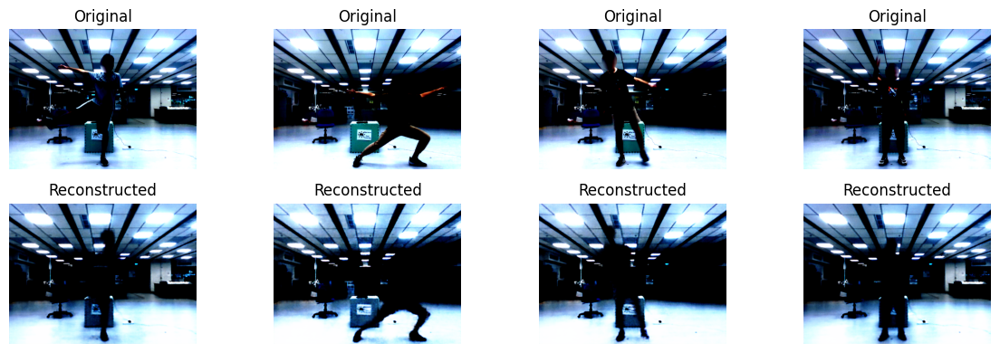

Epoch 7/20 [Train]: 100%|██████████| 378/378 [01:03<00:00,  5.98it/s]

Epoch 7 - Train Loss: 0.2788


Epoch 7 - Val Loss: 0.2814


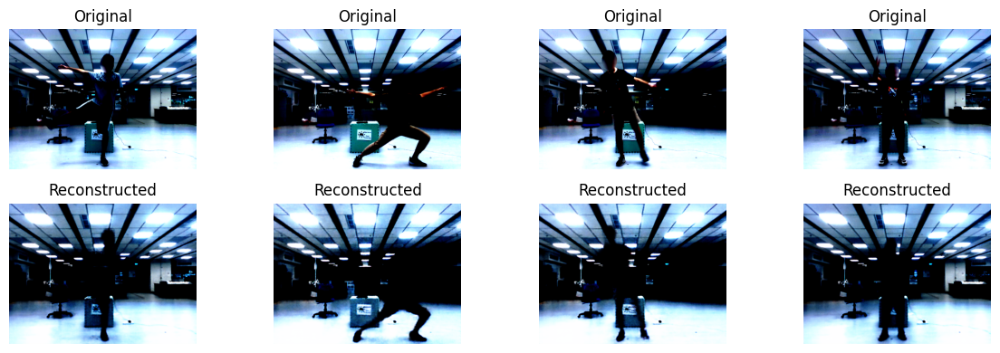

Epoch 8/20 [Train]: 100%|██████████| 378/378 [01:03<00:00,  5.97it/s]

Epoch 8 - Train Loss: 0.2783


Epoch 8 - Val Loss: 0.2810


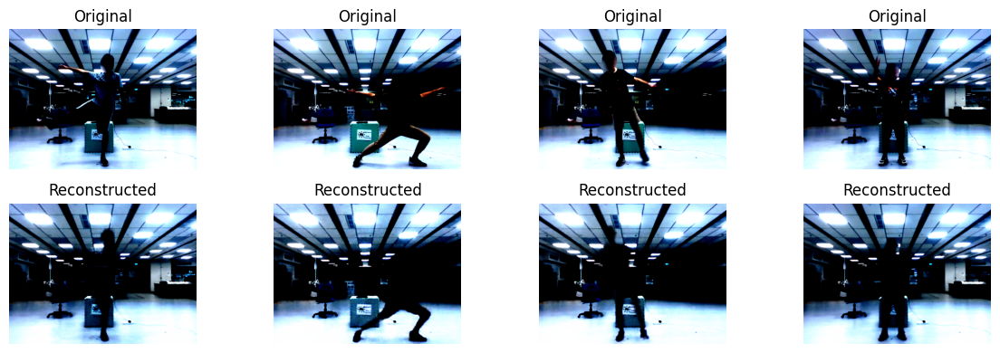

Epoch 9/20 [Train]: 100%|██████████| 378/378 [01:02<00:00,  6.02it/s]

Epoch 9 - Train Loss: 0.2779


Epoch 9 - Val Loss: 0.2808


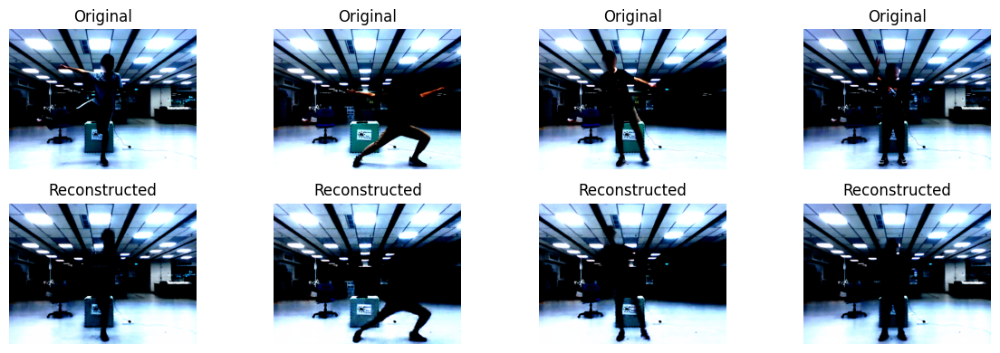

Epoch 10/20 [Train]: 100%|██████████| 378/378 [01:02<00:00,  6.00it/s]

Epoch 10 - Train Loss: 0.2775


Epoch 10 - Val Loss: 0.2804


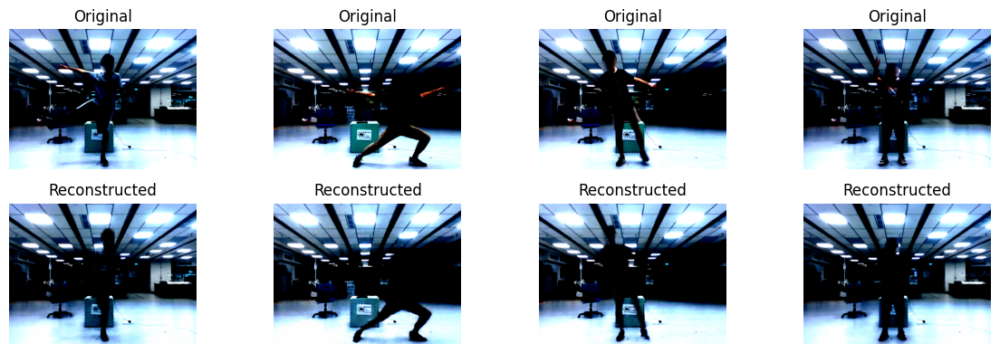

Epoch 11/20 [Train]: 100%|██████████| 378/378 [01:03<00:00,  5.99it/s]

Epoch 11 - Train Loss: 0.2772


Epoch 11 - Val Loss: 0.2802


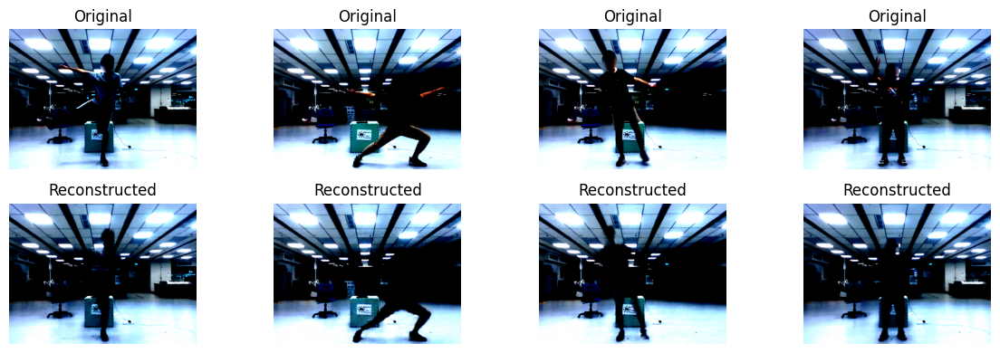

Epoch 12/20 [Train]: 100%|██████████| 378/378 [01:02<00:00,  6.03it/s]

Epoch 12 - Train Loss: 0.2770


KeyboardInterrupt: 

In [64]:
from tqdm import tqdm

# Khởi tạo mô hình
img_encoder = ImageEncoder(input_shape=(3, 480, 640), feature_dim=256).to(device)
img_decoder = ImageDecoder(feature_dim=256, output_shape=(3, 480, 640)).to(device)

# Optimizer & Loss
optimizer = torch.optim.Adam(list(encoder.parameters()) + list(decoder.parameters()), lr=1e-4)
criterion = torch.nn.MSELoss()

# Hàm plot ảnh
def plot_reconstructions(original, reconstructed, num_images=4):
    original = original.cpu().detach().numpy()
    reconstructed = reconstructed.cpu().detach().numpy()

    plt.figure(figsize=(12, 4))
    for i in range(num_images):
        # Ảnh gốc
        plt.subplot(2, num_images, i+1)
        plt.imshow(original[i].transpose(1, 2, 0))
        plt.axis('off')
        plt.title("Original")

        # Ảnh tái tạo
        plt.subplot(2, num_images, i+1+num_images)
        plt.imshow(reconstructed[i].transpose(1, 2, 0))
        plt.axis('off')
        plt.title("Reconstructed")
    plt.tight_layout()
    plt.show()

# Vòng lặp huấn luyện
num_epochs = 20

for epoch in range(num_epochs):
    encoder.train()
    decoder.train()
    running_loss = 0.0

    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]"):
        (_, _), images, _ = batch
        images = images.to(device)

        optimizer.zero_grad()
        features = img_encoder(images)
        recon_images = img_decoder(features)

        loss = criterion(recon_images, images)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    train_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1} - Train Loss: {train_loss:.4f}")

    # Validation
    encoder.eval()
    decoder.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch in test_loader:
            (_, _), images, _ = batch
            images = images.to(device)

            features = encoder(images)
            recon_images = decoder(features)
            loss = criterion(recon_images, images)

            val_loss += loss.item()

        val_loss /= len(test_loader)
        print(f"Epoch {epoch+1} - Val Loss: {val_loss:.4f}")

        # Hiển thị ảnh đầu tiên trong batch đầu tiên
        if epoch % 1 == 0:
            plot_reconstructions(images, recon_images, num_images=4)